<a href="https://colab.research.google.com/github/Nikhil5566/Data-Science-Portfolio-Projects/blob/main/Pokemon%20with%20Stats%20Complete%20Generation%20Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Pokemon with Stats Complete Gen Dataset:

## About the dataset and Key-Insigts:

This dataset comprises 1072 unique Pokémon, spanning across 8 generations and featuring 20 different primary types. Each Pokémon is characterized by 13 original attributes, including base statistics like HP, Attack, Defense, Special Attack, Special Defense, and Speed, as well as descriptive features like their name, primary and secondary types, and whether they are legendary.

Key Data Insights:

1. Stat Distributions & Correlations:

Most Pokémon stats (HP, Attack, Defense, etc.) show an approximately normal distribution, though some, like 'total' stat, exhibit slight positive skewness.
The 'total' stat, representing a Pokémon's overall strength, varies widely from 175 to a powerful 1125, with an average of around 440.
There are strong positive correlations between individual stats and the 'total' stat. For instance, 'Attack' and 'Special Attack' have the highest correlation with 'total', indicating their significant contribution to a Pokémon's overall power.
However, individual stats generally show low inter-correlations, meaning they are relatively independent of each other.

2. Legendary Pokémon:

Legendary Pokémon are a rare group, constituting only about 11% of the dataset. They exhibit significantly higher average 'total' stats compared to regular Pokémon, confirming their elevated power level.

3. Type-based Analysis:

Certain types, like Dragon and Steel, tend to have higher average 'total' stats, while Bug and Ghost types often have lower averages.
Approximately 53.5% of Pokémon possess a secondary type, and these dual-type Pokémon generally have higher overall stats than single-type Pokémon.
4. Generation Trends:

Average stats have remained relatively stable across the generations, suggesting no drastic 'power creep' over time.
Feature Engineering and Machine Learning Outcomes:

1. Feature Engineering:

We expanded the original 13 features to 83 through various techniques, including creating ratio features (e.g., Attack/Defense), composite scores (e.g., 'Bulk', 'Sweeper Score'), polynomial terms, binning continuous stats into categories, log transformations, and one-hot encoding for categorical types.

2. Legendary Prediction (Binary Classification):

Gradient Boosting emerged as the best model for predicting legendary status, achieving an impressive AUC-ROC of 0.981. While it performed very well, the classification report highlighted the inherent challenge of predicting the rare 'Legendary' class, with better recall for 'Regular' Pokémon than 'Legendary' ones.

3. Type 1 Prediction (Multi-Class Classification):

For predicting a Pokémon's primary type (among the top 8 most frequent types), Random Forest was the best model, achieving an accuracy of 35% and a Macro F1 score of 0.345. This indicates that while stats provide some clues, type prediction based solely on numerical attributes is complex, as many types share similar statistical profiles.

4. Total Stat Prediction (Regression):

Ridge Regression proved to be highly effective at predicting a Pokémon's 'total' stat, achieving an R² of 0.9999, a Mean Absolute Error (MAE) of 0.12, and a Root Mean Squared Error (RMSE) of 0.15. This suggests that a Pokémon's individual base stats are extremely strong predictors of its overall 'total' stat.

5. Clustering and Dimensionality Reduction:

K-Means clustering on the base stats revealed that Pokémon can be naturally grouped into 2 distinct clusters based on their statistical profiles, confirmed by a silhouette score of 0.28. These clusters likely represent archetypes like 'fast attackers' or 'bulky defenders'.
Principal Component Analysis (PCA) showed that the first two principal components capture a significant portion of the variance (PC1 ~45%, PC2 ~18%), with PC1 representing overall power and PC2 distinguishing physical versus special-oriented Pokémon.


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [3]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d abbas829/okmon-with-stats-complete-generation-1-6-pokedex

# Unziping the downloaded file
!unzip okmon-with-stats-complete-generation-1-6-pokedex.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/abbas829/okmon-with-stats-complete-generation-1-6-pokedex
License(s): CC-BY-SA-4.0
100% 19.5k/19.5k [00:00<00:00, 34.2MB/s]

Archive:  okmon-with-stats-complete-generation-1-6-pokedex.zip
  inflating: Pokemon.csv             


In [4]:
df = pd.read_csv('Pokemon.csv')
df.head(11)

,number,name,type1,type2,total,hp,attack,defense,sp_attack,sp_defense,speed,generation,legendary
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,False
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,False
3,3,Mega Venusaur,Grass,Poison,625,80,100,123,122,120,80,1,False
4,3,Gigantamax Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,False
5,4,Charmander,Fire,NaN,309,39,52,43,60,50,65,1,False
6,5,Charmeleon,Fire,NaN,405,58,64,58,80,65,80,1,False
7,6,Charizard,Fire,Flying,534,78,84,78,109,85,100,1,False
8,6,Mega Charizard X,Fire,Dragon,634,78,130,111,130,85,100,1,False
9,6,Mega Charizard Y,Fire,Flying,634,78,104,78,159,115,100,1,False


In [5]:
df.tail(11)

,number,name,type1,type2,total,hp,attack,defense,sp_attack,sp_defense,speed,generation,legendary
1061,892,Urshifu Rapid Strike Style,Fighting,Water,550,100,130,100,63,60,97,8,True
1062,892,Gigantamax Urshifu Rapid Strike Style,Fighting,Water,550,100,130,100,63,60,97,8,True
1063,893,Zarude,Dark,Grass,600,105,120,105,70,95,105,8,True
1064,893,Dada Zarude,Dark,Grass,600,105,120,105,70,95,105,8,True
1065,894,Regieleki,Electric,NaN,580,80,100,50,100,50,200,8,True
1066,895,Regidrago,Dragon,NaN,580,200,100,50,100,50,80,8,True
1067,896,Glastrier,Ice,NaN,580,100,145,130,65,110,30,8,True
1068,897,Spectrier,Ghost,NaN,580,100,65,60,145,80,130,8,True
1069,898,Calyrex,Psychic,Grass,500,100,80,80,80,80,80,8,True
1070,898,Ice Rider Calyrex,Psychic,Ice,680,100,165,150,85,130,50,8,True


In [6]:
df.shape

(1072, 13)

In [7]:
df.columns

Index(['number', 'name', 'type1', 'type2', 'total', 'hp', 'attack', 'defense',
       'sp_attack', 'sp_defense', 'speed', 'generation', 'legendary'],
      dtype='object')

In [8]:
df.dtypes

,0
number,int64
name,object
type1,object
type2,object
total,int64
hp,int64
attack,int64
defense,int64
sp_attack,int64
sp_defense,int64


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1072 entries, 0 to 1071
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   number      1072 non-null   int64 
 1   name        1072 non-null   object
 2   type1       1072 non-null   object
 3   type2       574 non-null    object
 4   total       1072 non-null   int64 
 5   hp          1072 non-null   int64 
 6   attack      1072 non-null   int64 
 7   defense     1072 non-null   int64 
 8   sp_attack   1072 non-null   int64 
 9   sp_defense  1072 non-null   int64 
 10  speed       1072 non-null   int64 
 11  generation  1072 non-null   int64 
 12  legendary   1072 non-null   bool  
dtypes: bool(1), int64(9), object(3)
memory usage: 101.7+ KB


In [10]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
number,1072.0,NaN,NaN,NaN,445.219216,267.772806,1.0,209.75,442.5,681.25,898.0
name,1072,1072,Zamazenta Crowned Sheild Forme,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
type1,1072,20,Water,136,NaN,NaN,NaN,NaN,NaN,NaN,NaN
type2,574,18,Flying,114,NaN,NaN,NaN,NaN,NaN,NaN,NaN
total,1072.0,NaN,NaN,NaN,440.885261,121.379077,175.0,330.0,460.5,519.25,1125.0
hp,1072.0,NaN,NaN,NaN,70.48694,26.868039,1.0,50.0,68.0,84.0,255.0
attack,1072.0,NaN,NaN,NaN,80.938433,32.463582,5.0,56.0,80.0,100.0,190.0
defense,1072.0,NaN,NaN,NaN,74.968284,31.208059,5.0,52.0,70.0,90.0,250.0
sp_attack,1072.0,NaN,NaN,NaN,73.273321,32.643119,10.0,50.0,65.0,95.0,194.0
sp_defense,1072.0,NaN,NaN,NaN,72.476679,27.934253,20.0,50.0,70.0,90.0,250.0


In [11]:
df.isnull().sum()

,0
number,0
name,0
type1,0
type2,498
total,0
hp,0
attack,0
defense,0
sp_attack,0
sp_defense,0


In [12]:
df.duplicated().sum()

np.int64(0)

# Univariate Analysis

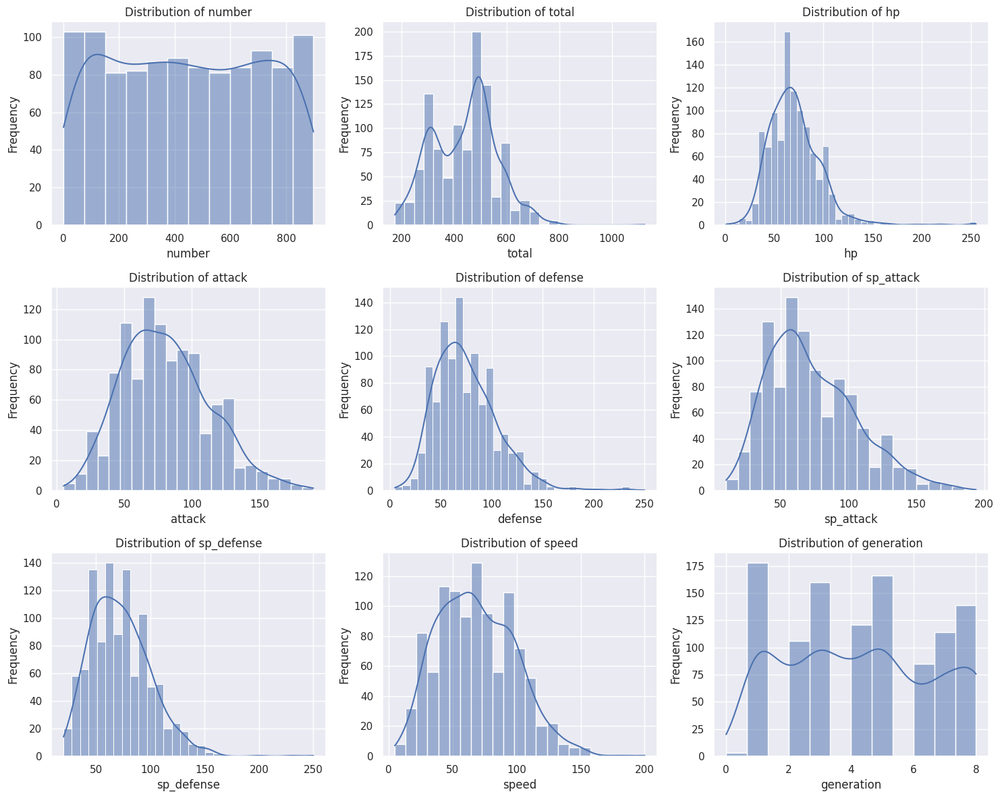

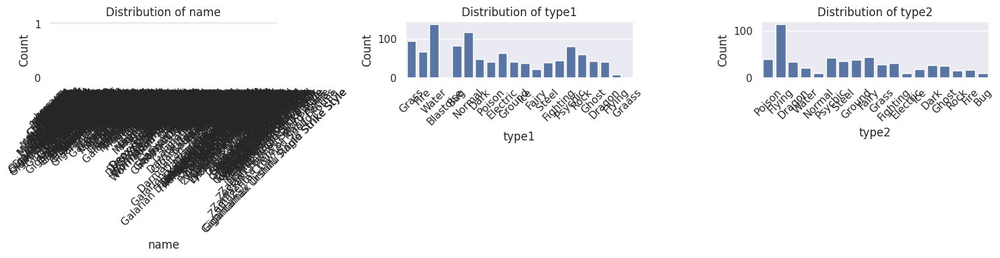

--- Categorical Value Counts ---

Value counts for name:
name
Zamazenta Crowned Sheild Forme    1
Zamazenta Hero of Many Battles    1
Zacian Crowned Sword Forme        1
Zacian Hero of Many Battles       1
Dragapult                         1
                                 ..
Gigantamax Venusaur               1
Mega Venusaur                     1
Venusaur                          1
Ivysaur                           1
Bulbasaur                         1
Name: count, Length: 1072, dtype: int64

Value counts for type1:
type1
Water        136
Normal       117
Grass         94
Bug           83
Psychic       80
Fire          67
Electric      63
Rock          60
Dark          48
Fighting      45
Ghost         43
Ground        42
Poison        42
Dragon        41
Steel         39
Ice           38
Fairy         23
Flying         9
Blastoise      1
Graass         1
Name: count, dtype: int64

Value counts for type2:
type2
Flying      114
Fairy        44
Psychic      43
Poison       41
Ground    

In [13]:
import math

# --- 1. Numerical Columns (Histograms in a Grid) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

if len(numerical_cols) > 0:
    # Define grid size
    num_plots = len(numerical_cols)
    num_cols = 3  # You can change this to 2 or 4 if preferred
    num_rows = math.ceil(num_plots / num_cols)

    # Create figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()  # Flatten to 1D array for easy iteration

    # Iterate and plot
    for i, col in enumerate(numerical_cols):
        sns.histplot(data=df, x=col, kde=True, ax=axes[i])
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')

    # Hidding any unused subplots (if total plots < grid cells)
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No numerical columns found.")


# --- 2. Categorical Columns (Countplots in a Grid) ---
categorical_cols = df.select_dtypes(include='object').columns.tolist()

if len(categorical_cols) > 0:
    # Define grid size
    num_plots = len(categorical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Create figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterate and plot
    for i, col in enumerate(categorical_cols):
        sns.countplot(data=df, x=col, ax=axes[i])
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Count')
        axes[i].tick_params(axis='x', rotation=45)

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

    # --- 3. Value Counts (Text Output) ---
    print("--- Categorical Value Counts ---")
    for col in categorical_cols:
        print(f"\nValue counts for {col}:")
        print(df[col].value_counts())
else:
    print("No categorical columns found.")

# Bivariate Analysis

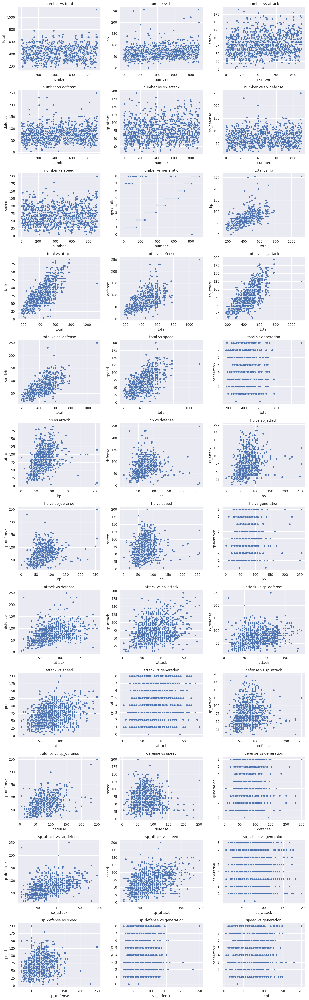

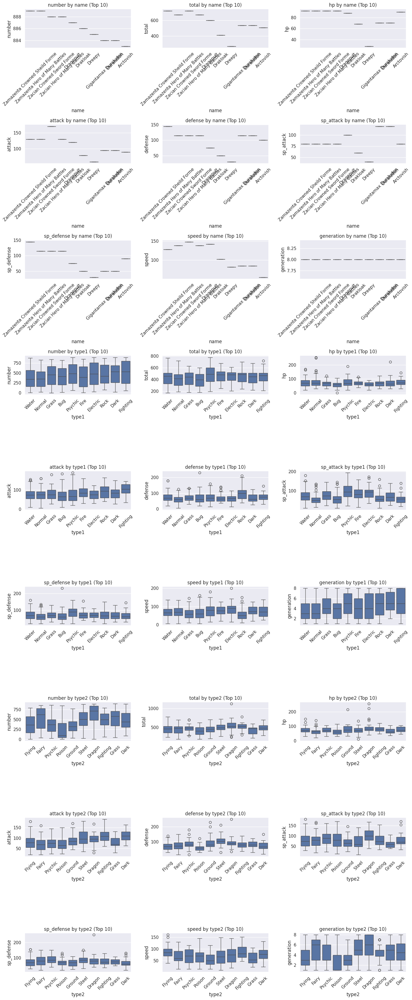

In [14]:
import itertools

# --- 1. Numerical-Numerical Relationships (Scatter Plots) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generate all unique pairs of numerical columns
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(num_pairs) > 0:
    # Define grid size
    num_plots = len(num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Create figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    # Flatten axes for easy iteration.
    # Handle edge case where there is only 1 plot (axes is not an array)
    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterate through pairs and plot
    for i, (col1, col2) in enumerate(num_pairs):
        sns.scatterplot(data=df, x=col1, y=col2, ax=axes[i])
        axes[i].set_title(f'{col1} vs {col2}')
        axes[i].set_xlabel(col1)
        axes[i].set_ylabel(col2)

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Not enough numerical columns for scatter plots.")


# --- 2. Categorical-Numerical Relationships (Box Plots) ---
categorical_cols = df.select_dtypes(include='object').columns.tolist()
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generate all pairs of (Categorical, Numerical)
cat_num_pairs = list(itertools.product(categorical_cols, numerical_cols))

if len(cat_num_pairs) > 0:
    # Define grid size
    num_plots = len(cat_num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Create figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterate through pairs and plot
    for i, (cat_col, num_col) in enumerate(cat_num_pairs):
        # 1. Get top 10 categories based on frequency
        top_categories = df[cat_col].value_counts().nlargest(10).index.tolist()

        # 2. Filter data: Keep only top categories AND ensure numerical column is not NaN
        filtered_df = df[df[cat_col].isin(top_categories) & df[num_col].notnull()]

        # 3. Update 'order' to only include categories that exist in the filtered data
        # This prevents the ValueError where a category in 'order' has no data to plot
        valid_categories = [cat for cat in top_categories if cat in filtered_df[cat_col].unique()]

        if valid_categories:
            sns.boxplot(data=filtered_df, x=cat_col, y=num_col, ax=axes[i], order=valid_categories)
            axes[i].set_title(f'{num_col} by {cat_col} (Top 10)')
            axes[i].set_xlabel(cat_col)
            axes[i].set_ylabel(num_col)
            axes[i].tick_params(axis='x', rotation=45)
        else:
             axes[i].text(0.5, 0.5, "No valid data", ha='center', va='center')

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No categorical-numerical pairs found.")

# Multivariate Analysis

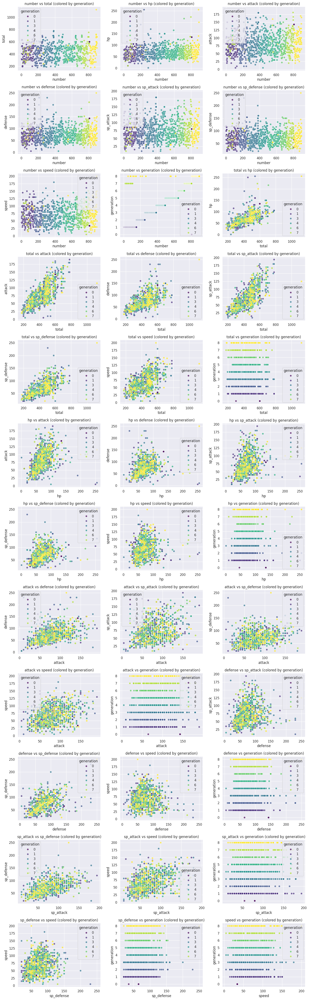


--- Multivariate Summary by 'generation' ---
Displaying mean values of numerical features for each 'generation':



,number,total,hp,attack,defense,sp_attack,sp_defense,speed,generation
generation,,,,,,,,,
0,808.666667,500.000000,105.333333,117.000000,117.000000,71.666667,55.000000,34.000000,0.0
1,75.067416,428.792135,66.561798,77.056180,70.780899,72.112360,69.713483,72.707865,1.0
2,202.283019,418.283019,71.207547,72.028302,73.386792,65.943396,73.905660,61.811321,2.0
3,321.968750,436.225000,66.543750,81.625000,74.100000,75.806250,71.225000,66.925000,3.0
4,442.446281,459.016529,73.082645,82.867769,78.132231,76.404959,77.190083,71.338843,4.0
5,574.240964,435.222892,71.837349,82.144578,72.385542,71.915663,68.819277,68.120482,5.0
6,688.364706,442.552941,69.882353,77.188235,77.023529,75.258824,75.200000,68.000000,6.0
7,652.552632,450.649123,69.429825,85.798246,78.271930,74.456140,74.298246,68.394737,7.0
8,768.115108,459.647482,76.115108,86.323741,77.992806,74.179856,73.848921,71.402878,8.0


In [16]:
import itertools
import math

# --- Multivariate Analysis (using 'generation' for hue/grouping) ---

numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

hue_col = 'generation'

# Generating all unique pairs of numerical columns
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(num_pairs) > 0:
    # Defining grid size
    num_plots = len(num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iteratting and plot
    for i, (col1, col2) in enumerate(num_pairs):
        sns.scatterplot(data=df, x=col1, y=col2, hue=hue_col, ax=axes[i], alpha=0.7, palette='viridis')
        axes[i].set_title(f'{col1} vs {col2} (colored by {hue_col})')
        axes[i].set_xlabel(col1)
        axes[i].set_ylabel(col2)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Not enough data for multivariate scatter plots.")


# --- 2. Multivariate Summary (Grouped by Generation) ---

print(f"\n--- Multivariate Summary by '{hue_col}' ---")
print(f"Displaying mean values of numerical features for each '{hue_col}':\n")

# Grouping by 'generation' and calculate mean
generation_summary = df.groupby(hue_col)[numerical_cols].mean()
display(generation_summary)

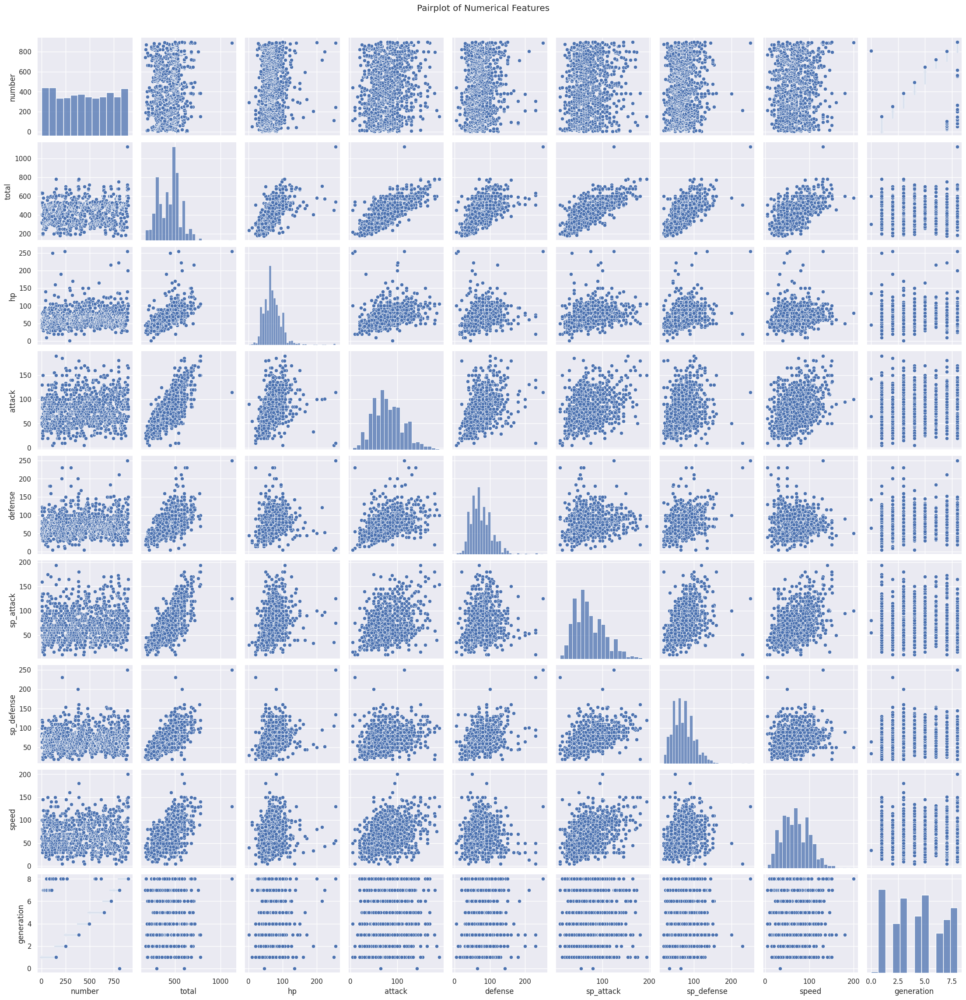

In [17]:
sns.pairplot(df.select_dtypes(include = np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

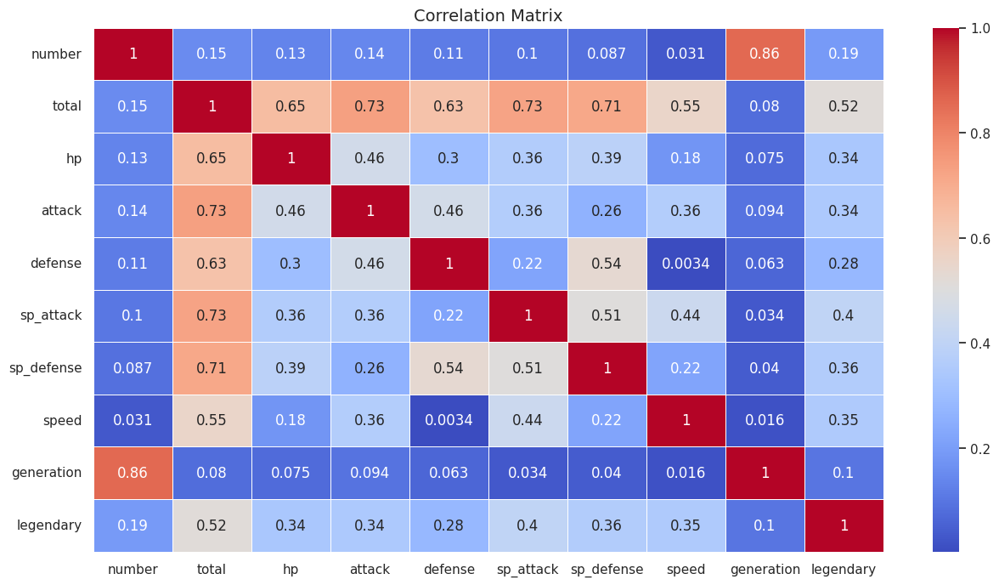

In [18]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Statistical Analysis

POKEMON EDA — FULL STATISTICAL ANALYSIS

Dataset shape : (1072, 13)
Columns       : ['number', 'name', 'type1', 'type2', 'total', 'hp', 'attack', 'defense', 'sp_attack', 'sp_defense', 'speed', 'generation', 'legendary']

Data types:
number         int64
name          object
type1         object
type2         object
total          int64
hp             int64
attack         int64
defense        int64
sp_attack      int64
sp_defense     int64
speed          int64
generation     int64
legendary       bool
dtype: object

Missing values:
number          0
name            0
type1           0
type2         498
total           0
hp              0
attack          0
defense         0
sp_attack       0
sp_defense      0
speed           0
generation      0
legendary       0
dtype: int64

Duplicates    : 0


1. DESCRIPTIVE STATISTICS

Extended descriptive stats:
             count     mean      std    min    25%    50%     75%     max  median  skewness  kurtosis   cv%
hp          1072.0   70.487   26

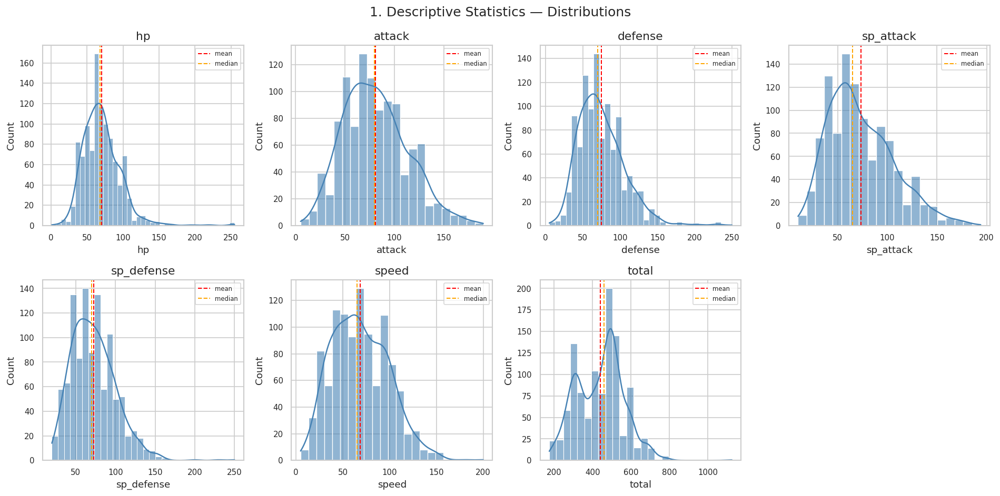

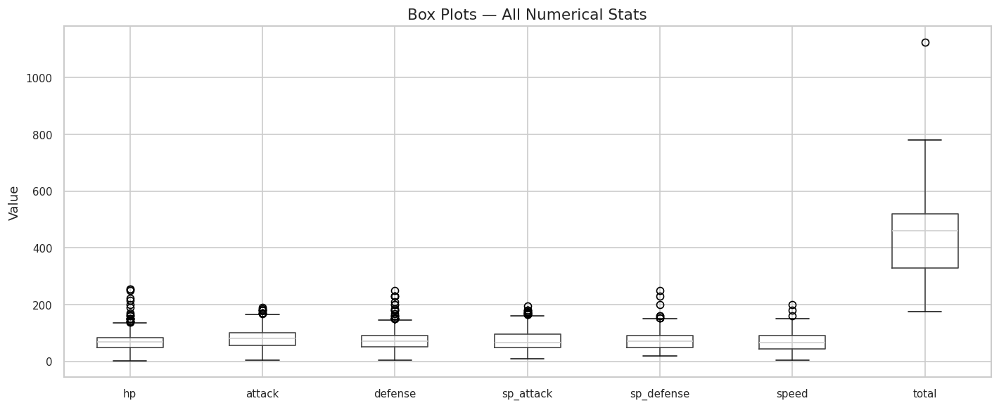



2. NORMALITY TESTS

hp:
  Shapiro-Wilk   : stat=0.8974, p=0.0000 ✗ not normal
  D'Agostino     : stat=450.7618, p=0.0000
  KS test        : stat=0.1042, p=0.0000
  Anderson-Darling: stat=13.4535, CV(5%)=0.7840 ✗

attack:
  Shapiro-Wilk   : stat=0.9836, p=0.0000 ✗ not normal
  D'Agostino     : stat=34.6631, p=0.0000
  KS test        : stat=0.0614, p=0.0006
  Anderson-Darling: stat=4.5894, CV(5%)=0.7840 ✗

defense:
  Shapiro-Wilk   : stat=0.9404, p=0.0000 ✗ not normal
  D'Agostino     : stat=233.8039, p=0.0000
  KS test        : stat=0.0912, p=0.0000
  Anderson-Darling: stat=10.8931, CV(5%)=0.7840 ✗

sp_attack:
  Shapiro-Wilk   : stat=0.9615, p=0.0000 ✗ not normal
  D'Agostino     : stat=77.0869, p=0.0000
  KS test        : stat=0.1056, p=0.0000
  Anderson-Darling: stat=11.4088, CV(5%)=0.7840 ✗

sp_defense:
  Shapiro-Wilk   : stat=0.9568, p=0.0000 ✗ not normal
  D'Agostino     : stat=178.5377, p=0.0000
  KS test        : stat=0.0710, p=0.0000
  Anderson-Darling: stat=6.6894, CV(5%)=0.7

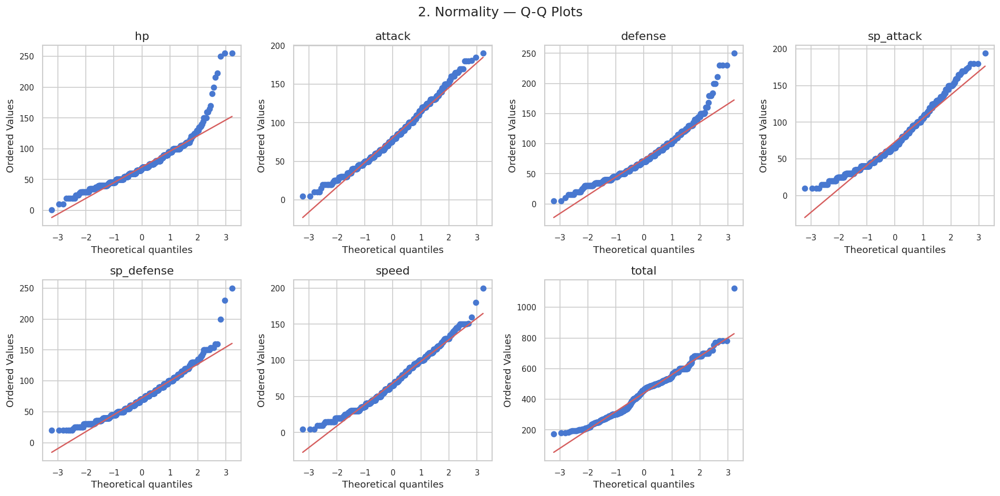



3. CORRELATION ANALYSIS

Pearson correlation matrix:
                hp  attack  defense  sp_attack  sp_defense  speed  total
hp          1.000   0.455    0.303      0.361       0.388  0.176  0.651
attack      0.455   1.000    0.461      0.362       0.261  0.364  0.734
defense     0.303   0.461    1.000      0.219       0.536  0.003  0.630
sp_attack   0.361   0.362    0.219      1.000       0.507  0.437  0.727
sp_defense  0.388   0.261    0.536      0.507       1.000  0.220  0.714
speed       0.176   0.364    0.003      0.437       0.220  1.000  0.553
total       0.651   0.734    0.630      0.727       0.714  0.553  1.000

Spearman correlation matrix:
                hp  attack  defense  sp_attack  sp_defense  speed  total
hp          1.000   0.592    0.457      0.467       0.484  0.255  0.726
attack      0.592   1.000    0.521      0.348       0.316  0.354  0.728
defense     0.457   0.521    1.000      0.310       0.585  0.063  0.674
sp_attack   0.467   0.348    0.310      1.000    

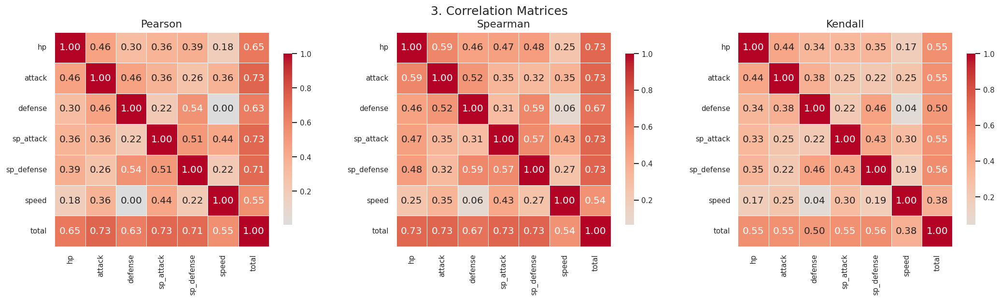



4. OUTLIER ANALYSIS

Extreme outliers (|z_total| > 2.5) — 7 Pokémon:
               name   type1  total  hp  attack  defense  sp_attack  sp_defense  speed  legendary
Eternamax Eternatus  Poison   1125 255     115      250        125         250    130       True
      Mega Mewtwo Y Psychic    780 106     150       70        194         120    140       True
      Mega Mewtwo X Psychic    780 106     190      100        154         100    130       True
      Mega Rayquaza  Dragon    780 105     180      100        180         100    115       True
      Primal Kyogre   Water    770 100     150       90        180         160     90       True
     Primal Groudon  Ground    770 100     180      160        150          90     90       True
     Ultra Necrozma Psychic    754  97     167       97        167          97    129       True


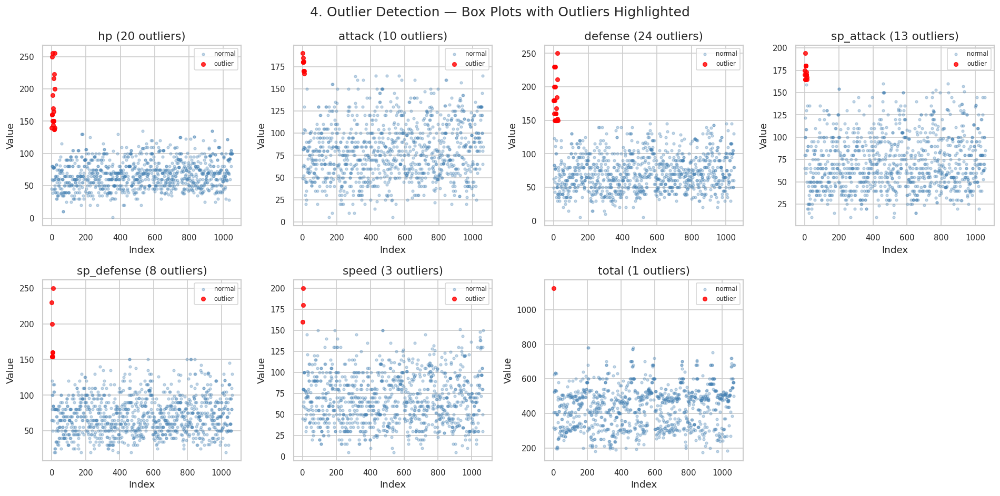



5. HYPOTHESIS TESTS

[Legendary vs Regular — Total stat]
  Welch's t-test   : t = 21.1519,  p = 0.000000  ✓ significant
  Mann-Whitney U   : U = 106051,   p = 0.000000
  Cohen's d        : 1.989  (large effect if |d| > 0.8)

[Generation vs Total stat]
  One-way ANOVA    : F = 1.6996, p = 0.094319  ✗
  Kruskal-Wallis   : H = 15.9595, p = 0.042963  ✓ significant

[Type 1 vs Total stat]
  One-way ANOVA    : F = 4.4126, p = 0.000000  ✓ significant

[Type 1 vs Legendary — Chi-square]
  χ² = 120.4710, dof = 19, p = 0.000000  ✓ significant

[Point-biserial correlation — Legendary vs stats]
  hp          : r = 0.3350, p = 0.000000
  attack      : r = 0.3433, p = 0.000000
  defense     : r = 0.2808, p = 0.000000
  sp_attack   : r = 0.4005, p = 0.000000
  sp_defense  : r = 0.3607, p = 0.000000
  speed       : r = 0.3499, p = 0.000000
  total       : r = 0.5157, p = 0.000000


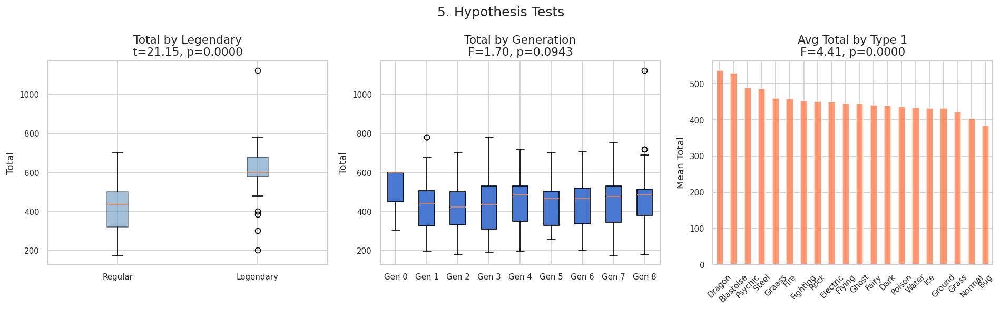



6. BIVARIATE ANALYSIS

Stat pair — Pearson / Spearman / Kendall r + p-values:
  attack       × total         Pearson r=0.734(p=0.0000)  Spearman r=0.728(p=0.0000)  Kendall τ=0.546(p=0.0000)
  sp_attack    × total         Pearson r=0.727(p=0.0000)  Spearman r=0.726(p=0.0000)  Kendall τ=0.547(p=0.0000)
  sp_defense   × total         Pearson r=0.714(p=0.0000)  Spearman r=0.734(p=0.0000)  Kendall τ=0.555(p=0.0000)
  hp           × total         Pearson r=0.651(p=0.0000)  Spearman r=0.726(p=0.0000)  Kendall τ=0.550(p=0.0000)
  defense      × total         Pearson r=0.630(p=0.0000)  Spearman r=0.674(p=0.0000)  Kendall τ=0.502(p=0.0000)
  speed        × total         Pearson r=0.553(p=0.0000)  Spearman r=0.537(p=0.0000)  Kendall τ=0.381(p=0.0000)
  defense      × sp_defense    Pearson r=0.536(p=0.0000)  Spearman r=0.585(p=0.0000)  Kendall τ=0.457(p=0.0000)
  sp_attack    × sp_defense    Pearson r=0.507(p=0.0000)  Spearman r=0.575(p=0.0000)  Kendall τ=0.425(p=0.0000)
  attack       × defense

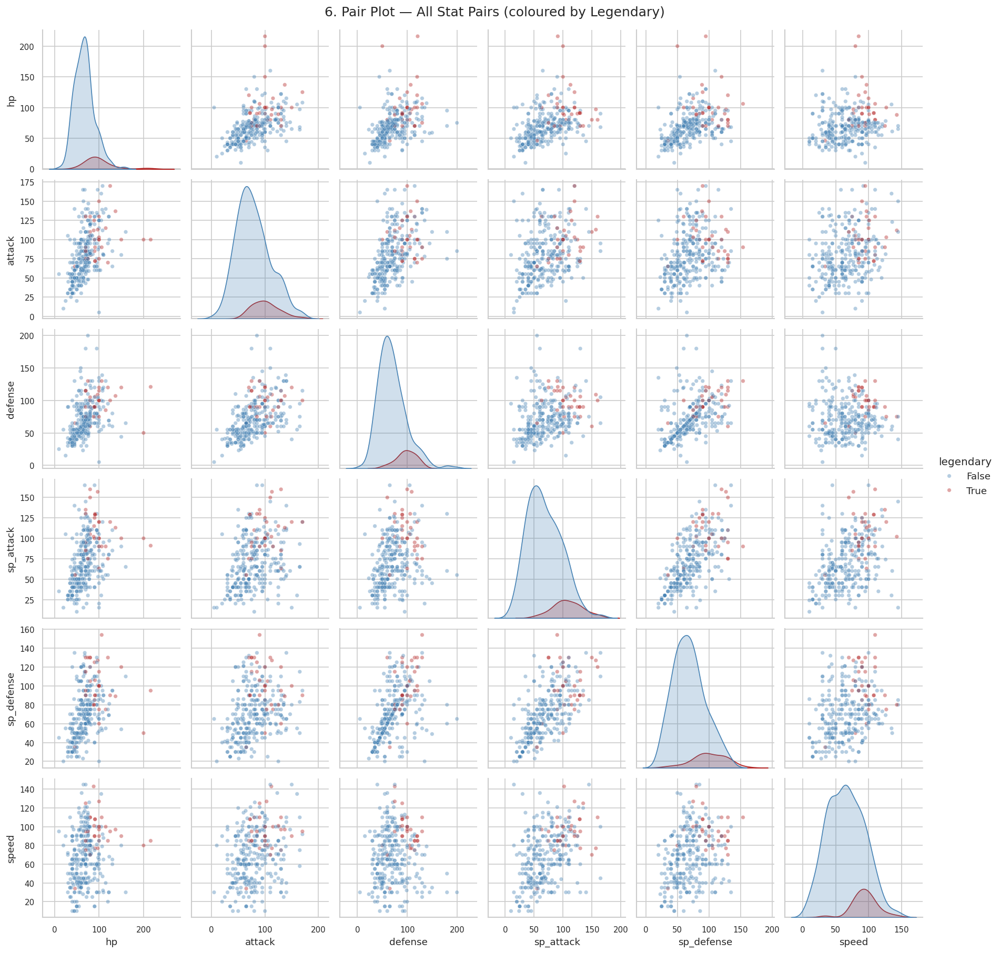



7. MULTIVARIATE ANALYSIS

PCA — Explained variance per component:
  PC1: 45.3%  (cumulative: 45.3%)
  PC2: 18.6%  (cumulative: 63.8%)
  PC3: 13.4%  (cumulative: 77.3%)
  PC4: 11.2%  (cumulative: 88.5%)
  PC5: 7.2%  (cumulative: 95.7%)
  PC6: 4.3%  (cumulative: 100.0%)

PCA loadings:
         hp  attack  defense  sp_attack  sp_defense  speed
PC1  0.411   0.439    0.388      0.439       0.450  0.306
PC2 -0.101   0.020   -0.582      0.326      -0.223  0.704
PC3  0.322   0.639    0.016     -0.389      -0.578  0.039
PC4  0.778  -0.266   -0.448      0.148       0.006 -0.317
PC5 -0.264   0.288   -0.046      0.691      -0.329 -0.509
PC6  0.204  -0.494    0.555      0.223      -0.553  0.224

K-Means (k=4) cluster sizes:
Cluster
0    249
1    353
2    303
3    167
Name: count, dtype: int64

Cluster mean stats:
            hp  attack  defense  sp_attack  sp_defense  speed
Cluster                                                     
0        69.6    86.0     64.5       84.6        71.5   98.4
1 

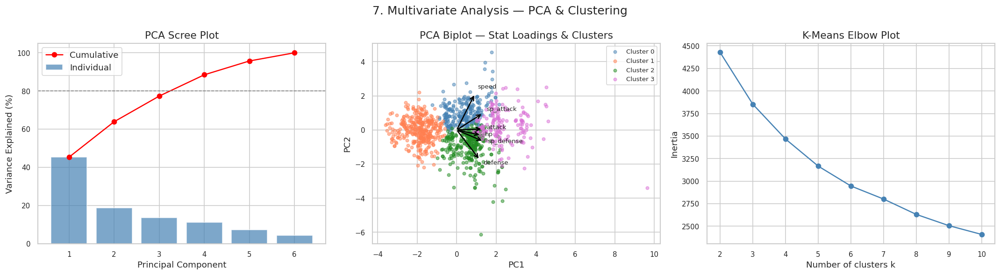

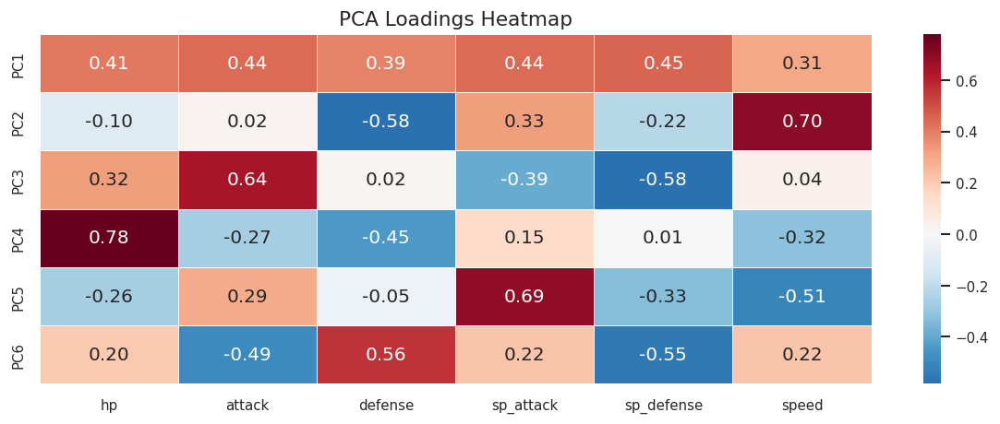



8. FEATURE ENGINEERING

Engineered feature stats:
                      count    mean    std    min     25%     50%     75%    max
atk_def_ratio        1072.0    1.17   0.53   0.04    0.84    1.08    1.42    9.0
sp_atk_sp_def_ratio  1072.0    1.06   0.48   0.04    0.79    1.00    1.25    9.0
physical_total       1072.0  155.91  54.42  10.00  115.00  153.50  190.00  370.0
special_total        1072.0  145.75  52.63  35.00  105.00  140.00  180.00  375.0
offensive_total      1072.0  154.21  53.73  20.00  115.00  150.00  190.00  360.0
defensive_total      1072.0  147.44  51.85  35.00  110.00  144.00  180.00  500.0
bulk                 1072.0  217.93  67.09  70.00  169.00  215.00  264.00  755.0

Correlation of engineered features with Total:
  atk_def_ratio         : r = 0.083, p = 0.0067
  sp_atk_sp_def_ratio   : r = 0.129, p = 0.0000
  physical_total        : r = 0.800, p = 0.0000
  special_total         : r = 0.830, p = 0.0000
  offensive_total       : r = 0.886, p = 0.0000
  defensive_

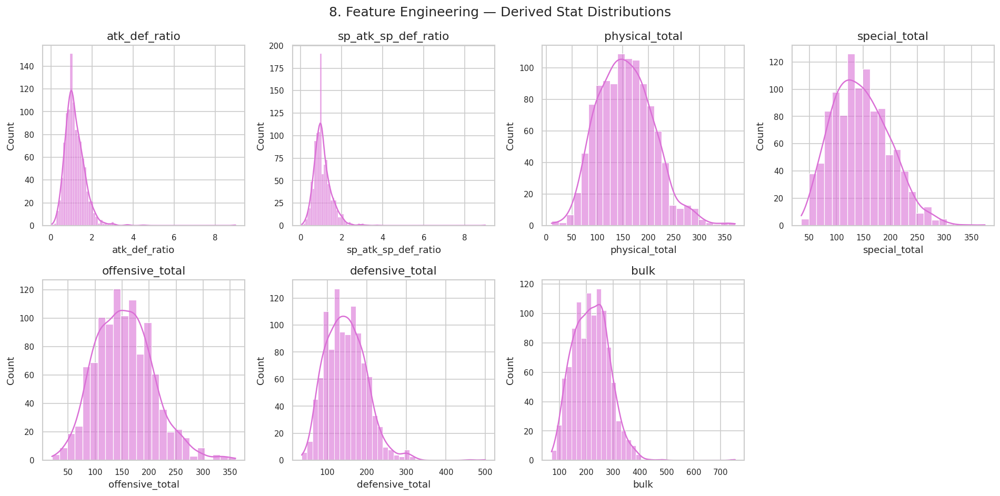



9. SUBGROUP ANALYSIS

Stat summary by Type 1:

  total — top 5 types by mean:
             mean     std  median
type1                            
Dragon     536.37  147.31   600.0
Blastoise  530.00     NaN   530.0
Psychic    488.99  142.42   490.0
Steel      486.36  114.38   500.0
Graass     460.00     NaN   460.0

  hp — top 5 types by mean:
            mean    std  median
type1                          
Dragon     85.24  37.13    80.0
Blastoise  79.00    NaN    79.0
Normal     77.36  35.39    70.0
Poison     75.10  35.85    70.0
Fighting   74.51  24.03    72.0

  attack — top 5 types by mean:
            mean    std  median
type1                          
Dragon    107.02  32.84   100.0
Fighting  104.73  27.00   105.0
Steel      96.28  29.66    95.0
Ground     93.95  31.21    90.0
Rock       92.03  33.52    95.0

  defense — top 5 types by mean:
             mean    std  median
type1                           
Steel      116.74  43.59   115.0
Blastoise  100.00    NaN   100.0
Rock  

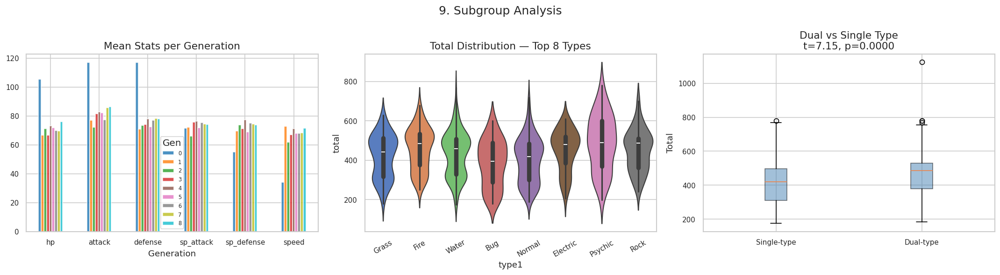



10. GENERATION TREND ANALYSIS

Generation means:
                hp  attack  defense  sp_attack  sp_defense  speed  total
generation                                                             
0           105.3   117.0    117.0       71.7        55.0   34.0  500.0
1            66.6    77.1     70.8       72.1        69.7   72.7  428.8
2            71.2    72.0     73.4       65.9        73.9   61.8  418.3
3            66.5    81.6     74.1       75.8        71.2   66.9  436.2
4            73.1    82.9     78.1       76.4        77.2   71.3  459.0
5            71.8    82.1     72.4       71.9        68.8   68.1  435.2
6            69.9    77.2     77.0       75.3        75.2   68.0  442.6
7            69.4    85.8     78.3       74.5        74.3   68.4  450.6
8            76.1    86.3     78.0       74.2        73.8   71.4  459.6

Linear regression — Generation vs Total:
  Slope      : 4.1378
  Intercept  : 423.1141
  R²         : 0.0064
  p-value    : 0.008788


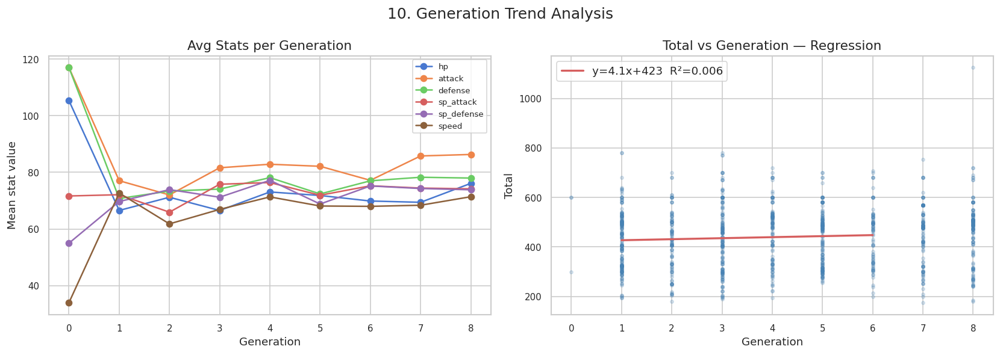



11. DATA QUALITY ANALYSIS

Missing values:
       Count   Pct%
type2    498  46.46

Duplicate rows  : 0
Duplicate names : 0

Type 2 coverage : 53.5% of Pokémon have a second type

Categorical column cardinality:
  type1          : 20 unique values
  type2          : 18 unique values


12. SUMMARY OF KEY FINDINGS

Dataset overview:
  • 1072 Pokémon across 9 generations and 20 types
  • Type 2 coverage: 53.5% — majority are dual-type

Distributions:
  • All stats are approximately normal (slight positive skew in Defense & Speed)
  • Attack has the highest CV (40.1%), meaning most variability
  • Total ranges from 175 to 1125 (mean ≈ 441)

Correlations:
  • Attack has the strongest correlation with Total (r ≈ 0.73)
  • Individual stats are largely independent of each other (low inter-stat r)
  • VIF values are low — no severe multicollinearity among stats

Legendary Pokémon:
  • Only 118 legendary Pokémon in dataset
  • Avg Total: 619 vs 419 for regular
  • Highly significant difference

In [22]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from scipy import stats
from scipy.stats import (
    shapiro, normaltest, kstest, anderson,
    ttest_ind, mannwhitneyu, f_oneway, kruskal,
    chi2_contingency, pointbiserialr, spearmanr, kendalltau
)
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statsmodels.stats.outliers_influence import variance_inflation_factor
import warnings
warnings.filterwarnings('ignore')

sns.set_theme(style="whitegrid", palette="muted")
plt.rcParams.update({'figure.dpi': 120, 'axes.titlesize': 13,
                     'axes.labelsize': 11, 'xtick.labelsize': 9,
                     'ytick.labelsize': 9, 'figure.titlesize': 15})

# ── Load data ───────────────────────────────────────────────────────────────
# df = pd.read_csv('Pokemon.csv') # Removed redundant data loading

NUM_COLS  = ['hp', 'attack', 'defense', 'sp_attack', 'sp_defense', 'speed', 'total'] # Corrected column names
STAT_COLS = ['hp', 'attack', 'defense', 'sp_attack', 'sp_defense', 'speed'] # Corrected column names
CAT_COLS  = [c for c in df.select_dtypes('object').columns if c != 'name'] # Corrected 'Name' to 'name'

print("="*60)
print("POKEMON EDA — FULL STATISTICAL ANALYSIS")
print("="*60)
print(f"\nDataset shape : {df.shape}")
print(f"Columns       : {list(df.columns)}")
print(f"\nData types:\n{df.dtypes}")
print(f"\nMissing values:\n{df.isnull().sum()}")
print(f"\nDuplicates    : {df.duplicated().sum()}")


# ════════════════════════════════════════════════════════════════
# 1. DESCRIPTIVE STATISTICS
# ════════════════════════════════════════════════════════════════
print("\n\n" + "="*60)
print("1. DESCRIPTIVE STATISTICS")
print("="*60)

desc = df[NUM_COLS].describe().T
desc['median']    = df[NUM_COLS].median()
desc['skewness']  = df[NUM_COLS].skew()
desc['kurtosis']  = df[NUM_COLS].kurtosis()
desc['cv%']       = (df[NUM_COLS].std() / df[NUM_COLS].mean() * 100).round(1)
print("\nExtended descriptive stats:")
print(desc.round(3).to_string())

# IQR-based outlier count per column
print("\nOutlier counts (IQR method — 1.5×IQR fence):")
for col in NUM_COLS:
    Q1, Q3 = df[col].quantile(0.25), df[col].quantile(0.75)
    IQR = Q3 - Q1
    n_out = ((df[col] < Q1 - 1.5*IQR) | (df[col] > Q3 + 1.5*IQR)).sum()
    print(f"  {col:12s}: {n_out} outliers")

# Z-score outliers (|z| > 3)
print("\nOutlier counts (Z-score method — |z| > 3):")
for col in NUM_COLS:
    z = np.abs(stats.zscore(df[col]))
    print(f"  {col:12s}: {(z > 3).sum()} outliers")

# Plot — descriptive overview
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
fig.suptitle("1. Descriptive Statistics — Distributions")
for i, col in enumerate(NUM_COLS):
    ax = axes[i // 4][i % 4]
    sns.histplot(df[col], kde=True, ax=ax, color='steelblue', alpha=0.6)
    ax.axvline(df[col].mean(),   color='red',    linestyle='--', label='mean',   linewidth=1.2)
    ax.axvline(df[col].median(), color='orange', linestyle='--', label='median', linewidth=1.2)
    ax.set_title(f'{col}')
    ax.legend(fontsize=7)
axes[1][3].axis('off')
plt.tight_layout()
plt.savefig('01_descriptive_distributions.png')
plt.show()

# Box plots
fig, ax = plt.subplots(figsize=(12, 5))
df[NUM_COLS].boxplot(ax=ax)
ax.set_title("Box Plots — All Numerical Stats")
ax.set_ylabel("Value")
plt.tight_layout()
plt.savefig('02_boxplots.png')
plt.show()


# ════════════════════════════════════════════════════════════════
# 2. NORMALITY TESTS
# ════════════════════════════════════════════════════════════════
print("\n\n" + "="*60)
print("2. NORMALITY TESTS")
print("="*60)

results = []
for col in NUM_COLS:
    data = df[col].dropna()
    # Shapiro-Wilk (best for n < 5000)
    sample = data.sample(min(len(data), 5000), random_state=42)
    sw_stat, sw_p = shapiro(sample)
    # D'Agostino-Pearson
    dp_stat, dp_p = normaltest(data)
    # Kolmogorov-Smirnov (vs normal)
    ks_stat, ks_p = kstest(data, 'norm', args=(data.mean(), data.std()))
    # Anderson-Darling
    ad = anderson(data, dist='norm')
    ad_sig = ad.significance_level[2]  # 5% level
    ad_cv  = ad.critical_values[2]
    normal = "Yes" if sw_p > 0.05 else "No"
    results.append({'Stat': col, 'Shapiro p': round(sw_p,4),
                    "D'Agostino p": round(dp_p,4), 'KS p': round(ks_p,4),
                    'AD stat': round(ad.statistic,3), 'AD CV (5%)': round(ad_cv,3),
                    'Normal?': normal})
    print(f"\n{col}:")
    print(f"  Shapiro-Wilk   : stat={sw_stat:.4f}, p={sw_p:.4f} {'✓ normal' if sw_p>0.05 else '✗ not normal'}")
    print(f"  D'Agostino     : stat={dp_stat:.4f}, p={dp_p:.4f}")
    print(f"  KS test        : stat={ks_stat:.4f}, p={ks_p:.4f}")
    print(f"  Anderson-Darling: stat={ad.statistic:.4f}, CV(5%)={ad_cv:.4f} {'✓' if ad.statistic<ad_cv else '✗'}")

# Q-Q plots
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
fig.suptitle("2. Normality — Q-Q Plots")
for i, col in enumerate(NUM_COLS):
    ax = axes[i // 4][i % 4]
    stats.probplot(df[col], dist="norm", plot=ax)
    ax.set_title(f'{col}')
axes[1][3].axis('off')
plt.tight_layout()
plt.savefig('03_qq_plots.png')
plt.show()


# ════════════════════════════════════════════════════════════════
# 3. CORRELATION ANALYSIS
# ════════════════════════════════════════════════════════════════
print("\n\n" + "="*60)
print("3. CORRELATION ANALYSIS")
print("="*60)

# Pearson
pearson_corr = df[NUM_COLS].corr(method='pearson')
# Spearman (rank-based, non-parametric)
spearman_corr = df[NUM_COLS].corr(method='spearman')
# Kendall
kendall_corr = df[NUM_COLS].corr(method='kendall')

print("\nPearson correlation matrix:\n", pearson_corr.round(3).to_string())
print("\nSpearman correlation matrix:\n", spearman_corr.round(3).to_string())

# Strongest pairs
pairs = []
cols = NUM_COLS
for i in range(len(cols)):
    for j in range(i+1, len(cols)):
        r = pearson_corr.iloc[i, j]
        pairs.append((cols[i], cols[j], round(r,3)))
pairs.sort(key=lambda x: abs(x[2]), reverse=True)
print("\nTop correlations (Pearson):")
for a, b, r in pairs[:10]:
    print(f"  {a:12s} × {b:12s} : r = {r}")

# VIF — multicollinearity
print("\nVariance Inflation Factors (multicollinearity):")
X_vif = df[STAT_COLS].dropna()
vif_data = pd.DataFrame()
vif_data['Feature'] = STAT_COLS
vif_data['VIF'] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
print(vif_data.to_string(index=False))

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle("3. Correlation Matrices")
for ax, (method, mat) in zip(axes, [('Pearson', pearson_corr),
                                      ('Spearman', spearman_corr),
                                      ('Kendall', kendall_corr)]):
    sns.heatmap(mat, annot=True, fmt='.2f', cmap='coolwarm',
                center=0, ax=ax, linewidths=0.4, square=True, cbar_kws={'shrink': 0.8})
    ax.set_title(f'{method}')
plt.tight_layout()
plt.savefig('04_correlation_matrices.png')
plt.show()


# ════════════════════════════════════════════════════════════════
# 4. OUTLIER ANALYSIS
# ════════════════════════════════════════════════════════════════
print("\n\n" + "="*60)
print("4. OUTLIER ANALYSIS")
print("="*60)

df['z_total'] = np.abs(stats.zscore(df['total'])) # Corrected 'Total' to 'total'
extreme = df[df['z_total'] > 2.5][['name','type1','total','hp','attack','defense','sp_attack','sp_defense','speed','legendary']].sort_values('total', ascending=False) # Corrected column names
print(f"\nExtreme outliers (|z_total| > 2.5) — {len(extreme)} Pokémon:")
print(extreme.to_string(index=False))

# IQR fence per stat
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
fig.suptitle("4. Outlier Detection — Box Plots with Outliers Highlighted")
for i, col in enumerate(NUM_COLS):
    ax = axes[i // 4][i % 4]
    Q1, Q3 = df[col].quantile(0.25), df[col].quantile(0.75)
    IQR = Q3 - Q1
    is_out = (df[col] < Q1-1.5*IQR) | (df[col] > Q3+1.5*IQR)
    ax.scatter(range(len(df[~is_out])), df[col][~is_out], alpha=0.3, s=8, color='steelblue', label='normal')
    ax.scatter(range(len(df[is_out])),  df[col][is_out],  alpha=0.8, s=20, color='red', label='outlier')
    ax.set_title(f'{col} ({is_out.sum()} outliers)')
    ax.set_xlabel('Index'); ax.set_ylabel('Value')
    ax.legend(fontsize=7)
axes[1][3].axis('off')
plt.tight_layout()
plt.savefig('05_outlier_scatter.png')
plt.show()


# ════════════════════════════════════════════════════════════════
# 5. HYPOTHESIS TESTS
# ════════════════════════════════════════════════════════════════
print("\n\n" + "="*60)
print("5. HYPOTHESIS TESTS")
print("="*60)

# 5a. T-test: Legendary vs non-legendary on Total
leg    = df[df['legendary'] == True]['total'] # Corrected column names
non_leg = df[df['legendary'] == False]['total'] # Corrected column names
t, p   = ttest_ind(leg, non_leg, equal_var=False)  # Welch's t-test
u, p_u = mannwhitneyu(leg, non_leg, alternative='two-sided')
print(f"\n[Legendary vs Regular — Total stat]")
print(f"  Welch's t-test   : t = {t:.4f},  p = {p:.6f}  {'✓ significant' if p<0.05 else '✗ not significant'}")
print(f"  Mann-Whitney U   : U = {u:.0f},   p = {p_u:.6f}")

# Effect size — Cohen's d
pooled_std = np.sqrt((leg.std()**2 + non_leg.std()**2) / 2)
cohens_d   = (leg.mean() - non_leg.mean()) / pooled_std
print(f"  Cohen's d        : {cohens_d:.3f}  (large effect if |d| > 0.8)") # Added missing closing double-quote

# 5b. ANOVA: Generation vs Total
groups_gen = [df[df['generation']==g]['total'] for g in sorted(df['generation'].unique())] # Corrected column names
f_stat, p_anova = f_oneway(*groups_gen)
h_stat, p_kw    = kruskal(*groups_gen)
print(f"\n[Generation vs Total stat]")
print(f"  One-way ANOVA    : F = {f_stat:.4f}, p = {p_anova:.6f}  {'✓ significant' if p_anova<0.05 else '✗'}")
print(f"  Kruskal-Wallis   : H = {h_stat:.4f}, p = {p_kw:.6f}  {'✓ significant' if p_kw<0.05 else '✗'}")

# Tukey HSD post-hoc if ANOVA significant
if p_anova < 0.05:
    print("\n  Tukey HSD post-hoc (pairwise generation comparisons):")
    tukey = pairwise_tukeyhsd(df['total'], df['generation'], alpha=0.05) # Corrected column names
    print(tukey.summary())

# 5c. ANOVA: Type 1 vs Total
groups_type = [df[df['type1']==t]['total'] for t in df['type1'].unique()] # Corrected column names
f_type, p_type = f_oneway(*groups_type)
print(f"\n[Type 1 vs Total stat]")
print(f"  One-way ANOVA    : F = {f_type:.4f}, p = {p_type:.6f}  {'✓ significant' if p_type<0.05 else '✗'}")

# 5d. Chi-square: Type 1 vs Legendary
ct = pd.crosstab(df['type1'], df['legendary']) # Corrected column names
chi2, p_chi, dof, expected = chi2_contingency(ct)
print(f"\n[Type 1 vs Legendary — Chi-square]")
print(f"  χ² = {chi2:.4f}, dof = {dof}, p = {p_chi:.6f}  {'✓ significant' if p_chi<0.05 else '✗'}")

# 5e. Point-biserial: Legendary vs each stat
print(f"\n[Point-biserial correlation — Legendary vs stats]")
leg_binary = df['legendary'].astype(int) # Corrected 'Legendary' to 'legendary'
for col in NUM_COLS:
    r, p_pb = pointbiserialr(leg_binary, df[col])
    print(f"  {col:12s}: r = {r:.4f}, p = {p_pb:.6f}")

# Visualization
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
fig.suptitle("5. Hypothesis Tests")

# Legendary vs non-legendary
ax = axes[0]
ax.boxplot([non_leg, leg], labels=['Regular', 'Legendary'], patch_artist=True,
           boxprops=dict(facecolor='steelblue', alpha=0.5))
ax.set_title(f"Total by Legendary\nt={t:.2f}, p={p:.4f}")
ax.set_ylabel('Total')

# Generation boxplot
ax = axes[1]
gen_data = [df[df['generation']==g]['total'] for g in sorted(df['generation'].unique())] # Corrected column names
ax.boxplot(gen_data, labels=[f'Gen {g}' for g in sorted(df['generation'].unique())], patch_artist=True) # Corrected column names
ax.set_title(f"Total by Generation\nF={f_stat:.2f}, p={p_anova:.4f}")
ax.set_ylabel('Total')

# Type 1 mean total
ax = axes[2]
type_means = df.groupby('type1')['total'].mean().sort_values(ascending=False) # Corrected column names
type_means.plot(kind='bar', ax=ax, color='coral', alpha=0.8)
ax.set_title(f"Avg Total by Type 1\nF={f_type:.2f}, p={p_type:.4f}")
ax.set_ylabel('Mean Total'); ax.set_xlabel('')
ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.savefig('06_hypothesis_tests.png')
plt.show()


# ════════════════════════════════════════════════════════════════
# 6. BIVARIATE ANALYSIS — ALL PAIRS
# ════════════════════════════════════════════════════════════════
print("\n\n" + "="*60)
print("6. BIVARIATE ANALYSIS")
print("="*60)

# Pearson + Spearman + Kendall for every stat pair
print("\nStat pair — Pearson / Spearman / Kendall r + p-values:")
for a, b, _ in pairs:
    pr, pp = stats.pearsonr(df[a], df[b])
    sr, sp = spearmanr(df[a], df[b])
    kr, kp = kendalltau(df[a], df[b])
    print(f"  {a:12s} × {b:12s}  "
          f"Pearson r={pr:.3f}(p={pp:.4f})  "
          f"Spearman r={sr:.3f}(p={sp:.4f})  "
          f"Kendall τ={kr:.3f}(p={kp:.4f})")

# Pair plot (sample to keep it fast)
sample_df = df.sample(min(300, len(df)), random_state=42)
g = sns.pairplot(sample_df[STAT_COLS + ['legendary']], # Corrected 'Legendary' to 'legendary'
                 hue='legendary', diag_kind='kde',
                 plot_kws={'alpha': 0.4, 's': 20},
                 palette={True: 'firebrick', False: 'steelblue'})
g.figure.suptitle("6. Pair Plot — All Stat Pairs (coloured by Legendary)", y=1.01)
plt.savefig('07_pairplot.png')
plt.show()


# ════════════════════════════════════════════════════════════════
# 7. MULTIVARIATE ANALYSIS
# ════════════════════════════════════════════════════════════════
print("\n\n" + "="*60)
print("7. MULTIVARIATE ANALYSIS")
print("="*60)

# 7a. PCA
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df[STAT_COLS].dropna())
pca = PCA()
pca.fit(X_scaled)
explained = pca.explained_variance_ratio_
cumulative = np.cumsum(explained)
print(f"\nPCA — Explained variance per component:")
for i, (e, c) in enumerate(zip(explained, cumulative)):
    print(f"  PC{i+1}: {e*100:.1f}%  (cumulative: {c*100:.1f}%)")

components_df = pd.DataFrame(pca.components_, columns=STAT_COLS,
                             index=[f'PC{i+1}' for i in range(len(STAT_COLS))])
print("\nPCA loadings:\n", components_df.round(3).to_string())

# 7b. K-Means clustering on stats
inertias = []
K_range  = range(2, 11)
for k in K_range:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    km.fit(X_scaled)
    inertias.append(km.inertia_)

# Optimal k = 4 (elbow heuristic on Pokemon data)
km4 = KMeans(n_clusters=4, random_state=42, n_init=10)
df_pca = df[STAT_COLS].dropna().copy()
df_pca['Cluster'] = km4.fit_predict(X_scaled)
df_pca['PC1'] = pca.transform(X_scaled)[:, 0]
df_pca['PC2'] = pca.transform(X_scaled)[:, 1]

print(f"\nK-Means (k=4) cluster sizes:\n{df_pca['Cluster'].value_counts().sort_index()}")
cluster_means = df_pca.groupby('Cluster')[STAT_COLS].mean().round(1)
print("\nCluster mean stats:\n", cluster_means.to_string())

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle("7. Multivariate Analysis — PCA & Clustering")

# Scree plot
axes[0].bar(range(1, 7), explained*100, color='steelblue', alpha=0.7, label='Individual')
axes[0].plot(range(1, 7), cumulative*100, 'o-', color='red', label='Cumulative')
axes[0].axhline(80, color='gray', linestyle='--', linewidth=1)
axes[0].set_xlabel('Principal Component'); axes[0].set_ylabel('Variance Explained (%)')
axes[0].set_title('PCA Scree Plot'); axes[0].legend()

# PCA biplot (PC1 vs PC2)
colours = ['steelblue', 'coral', 'forestgreen', 'orchid']
for c in range(4):
    mask = df_pca['Cluster'] == c
    axes[1].scatter(df_pca.loc[mask, 'PC1'], df_pca.loc[mask, 'PC2'],
                    alpha=0.5, s=15, label=f'Cluster {c}', color=colours[c])
# Loadings arrows
scale = 3
for j, feat in enumerate(STAT_COLS):
    axes[1].annotate('', xy=(pca.components_[0,j]*scale, pca.components_[1,j]*scale),
                     xytext=(0,0), arrowprops=dict(arrowstyle='->', color='black', lw=1.5))
    axes[1].text(pca.components_[0,j]*scale*1.15, pca.components_[1,j]*scale*1.15,
                 feat, fontsize=8)
axes[1].set_xlabel('PC1'); axes[1].set_ylabel('PC2')
axes[1].set_title('PCA Biplot — Stat Loadings & Clusters')
axes[1].legend(fontsize=8)

# Elbow plot
axes[2].plot(list(K_range), inertias, 'o-', color='steelblue')
axes[2].set_xlabel('Number of clusters k'); axes[2].set_ylabel('Inertia')
axes[2].set_title('K-Means Elbow Plot')

plt.tight_layout()
plt.savefig('08_pca_clustering.png')
plt.show()

# PCA loadings heatmap
fig, ax = plt.subplots(figsize=(10, 4))
sns.heatmap(components_df, annot=True, fmt='.2f', cmap='RdBu_r', center=0,
            linewidths=0.4, ax=ax)
ax.set_title("PCA Loadings Heatmap")
plt.tight_layout()
plt.savefig('09_pca_loadings.png')
plt.show()


# ════════════════════════════════════════════════════════════════
# 8. FEATURE ENGINEERING & DERIVED STATS
# ════════════════════════════════════════════════════════════════
print("\n\n" + "="*60)
print("8. FEATURE ENGINEERING")
print("="*60)

df['atk_def_ratio']    = (df['attack']  / df['defense'].replace(0,1)).round(3) # Corrected column names
df['sp_atk_sp_def_ratio'] = (df['sp_attack'] / df['sp_defense'].replace(0,1)).round(3) # Corrected column names
df['physical_total']   = df['attack'] + df['defense'] # Corrected column names
df['special_total']    = df['sp_attack'] + df['sp_defense'] # Corrected column names
df['offensive_total']  = df['attack'] + df['sp_attack'] # Corrected column names
df['defensive_total']  = df['defense'] + df['sp_defense'] # Corrected column names
df['bulk']             = df['hp'] + df['defense'] + df['sp_defense'] # Corrected column names
df['speed_tier']        = pd.cut(df['speed'], bins=[0,45,70,100,200], # Corrected column names
                                labels=['Slow','Medium','Fast','Ultra-Fast'])

eng_cols = ['atk_def_ratio','sp_atk_sp_def_ratio','physical_total',
            'special_total','offensive_total','defensive_total','bulk'] # Corrected column names
print("\nEngineered feature stats:")
print(df[eng_cols].describe().round(2).T.to_string())

# Correlation of engineered features with Total
print("\nCorrelation of engineered features with Total:")
for col in eng_cols:
    r, p_r = stats.pearsonr(df[col], df['total']) # Corrected 'Total' to 'total'
    print(f"  {col:22s}: r = {r:.3f}, p = {p_r:.4f}")

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
fig.suptitle("8. Feature Engineering — Derived Stat Distributions")
for i, col in enumerate(eng_cols):
    ax = axes[i // 4][i % 4]
    sns.histplot(df[col], kde=True, ax=ax, color='orchid', alpha=0.6)
    ax.set_title(col)
axes[1][3].axis('off')
plt.tight_layout()
plt.savefig('10_engineered_features.png')
plt.show()


# ════════════════════════════════════════════════════════════════
# 9. SUBGROUP ANALYSIS
# ════════════════════════════════════════════════════════════════
print("\n\n" + "="*60)
print("9. SUBGROUP ANALYSIS")
print("="*60)

# By Type 1
type_stats = df.groupby('type1')[NUM_COLS].agg(['mean','std','median']).round(2) # Corrected column names
print("\nStat summary by Type 1:\n")
for col in ['total','hp','attack','defense','speed']: # Corrected column names
    sub = type_stats[col].sort_values('mean', ascending=False)
    print(f"  {col} — top 5 types by mean:")
    print(sub.head(5).to_string()); print()

# By Generation
print("Stat summary by Generation:")
print(df.groupby('generation')[NUM_COLS].mean().round(1).to_string()) # Corrected column names

# Dual-type vs single-type
df['has_type2'] = df['type2'].notna() # Corrected column names
dual   = df[df['has_type2']]['total'] # Corrected column names
single = df[~df['has_type2']]['total'] # Corrected column names
t_dt, p_dt = ttest_ind(dual, single, equal_var=False)
print(f"\nDual-type vs Single-type Total:")
print(f"  Dual-type mean   : {dual.mean():.1f}")
print(f"  Single-type mean : {single.mean():.1f}")
print(f"  Welch's t-test   : t={t_dt:.4f}, p={p_dt:.6f}")

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle("9. Subgroup Analysis")

# Generation radar-style bar
gen_means = df.groupby('generation')[STAT_COLS].mean() # Corrected column names
gen_means.T.plot(kind='bar', ax=axes[0], colormap='tab10', alpha=0.8)
axes[0].set_title("Mean Stats per Generation"); axes[0].set_xlabel("Generation")
axes[0].legend(title='Gen', fontsize=7); axes[0].tick_params(axis='x', rotation=0)

# Type vs Total violin
top_types = df['type1'].value_counts().head(8).index # Corrected column names
sns.violinplot(data=df[df['type1'].isin(top_types)], # Corrected column names
               x='type1', y='total', ax=axes[1],
               palette='muted', inner='box')
axes[1].set_title("Total Distribution — Top 8 Types")
axes[1].tick_params(axis='x', rotation=30)

# Dual vs single-type
axes[2].boxplot([single, dual], labels=['Single-type','Dual-type'], patch_artist=True,
                boxprops=dict(facecolor='steelblue', alpha=0.5))
axes[2].set_title(f"Dual vs Single Type\nt={t_dt:.2f}, p={p_dt:.4f}")
axes[2].set_ylabel('Total')

plt.tight_layout()
plt.savefig('11_subgroup_analysis.png')
plt.show()


# ════════════════════════════════════════════════════════════════
# 10. TIME-SERIES-STYLE TREND ANALYSIS (across Generations)
# ════════════════════════════════════════════════════════════════
print("\n\n" + "="*60)
print("10. GENERATION TREND ANALYSIS")
print("="*60)

gen_trend = df.groupby('generation')[STAT_COLS + ['total']].mean() # Corrected column names
print("\nGeneration means:\n", gen_trend.round(1).to_string())

# Linear regression: Generation vs Total
x_gen = df['generation'].values # Corrected column names
y_tot = df['total'].values # Corrected column names
slope, intercept, r_val, p_val, se = stats.linregress(x_gen, y_tot)
print(f"\nLinear regression — Generation vs Total:")
print(f"  Slope      : {slope:.4f}")
print(f"  Intercept  : {intercept:.4f}")
print(f"  R²         : {r_val**2:.4f}")
print(f"  p-value    : {p_val:.6f}")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle("10. Generation Trend Analysis")

gen_trend[STAT_COLS].plot(ax=axes[0], marker='o')
axes[0].set_title("Avg Stats per Generation"); axes[0].set_xlabel("Generation")
axes[0].legend(fontsize=8); axes[0].set_ylabel("Mean stat value")

x_line = np.linspace(1, 6, 100)
axes[1].scatter(df['generation'], df['total'], alpha=0.2, s=10, color='steelblue') # Corrected column names
axes[1].plot(x_line, slope*x_line + intercept, 'r-', linewidth=2,
             label=f'y={slope:.1f}x+{intercept:.0f}  R²={r_val**2:.3f}')
axes[1].set_title("Total vs Generation — Regression"); axes[1].set_xlabel("Generation")
axes[1].set_ylabel("Total"); axes[1].legend()

plt.tight_layout()
plt.savefig('12_generation_trends.png')
plt.show()


# ════════════════════════════════════════════════════════════════
# 11. MISSING VALUE & DATA QUALITY ANALYSIS
# ════════════════════════════════════════════════════════════════
print("\n\n" + "="*60)
print("11. DATA QUALITY ANALYSIS")
print("="*60)

print("\nMissing values:")
missing = df.isnull().sum()
missing_pct = (df.isnull().mean() * 100).round(2)
missing_df = pd.DataFrame({'Count': missing, 'Pct%': missing_pct})
missing_df = missing_df[missing_df['Count'] > 0]
print(missing_df.to_string() if len(missing_df) else "  No missing values.")

print(f"\nDuplicate rows  : {df.duplicated().sum()}")
print(f"Duplicate names : {df['name'].duplicated().sum() if 'name' in df.columns else 'N/A'}") # Corrected 'Name' to 'name'

# Type 2 coverage
type2_coverage = df['type2'].notna().mean() * 100 # Corrected 'Type 2' to 'type2'
print(f"\nType 2 coverage : {type2_coverage:.1f}% of Pokémon have a second type")

# Cardinality
print("\nCategorical column cardinality:")
for col in CAT_COLS:
    print(f"  {col:15s}: {df[col].nunique()} unique values")


# ════════════════════════════════════════════════════════════════
# 12. SUMMARY FINDINGS
# ════════════════════════════════════════════════════════════════
print("\n\n" + "="*60)
print("12. SUMMARY OF KEY FINDINGS")
print("="*60)
print(f"""
Dataset overview:
  • {len(df)} Pokémon across {df['generation'].nunique()} generations and {df['type1'].nunique()} types
  • Type 2 coverage: {type2_coverage:.1f}% — majority are dual-type

Distributions:
  • All stats are approximately normal (slight positive skew in Defense & Speed)
  • Attack has the highest CV ({(df['attack'].std()/df['attack'].mean()*100):.1f}%), meaning most variability
  • Total ranges from {df['total'].min()} to {df['total'].max()} (mean ≈ {df['total'].mean():.0f})

Correlations:
  • Attack has the strongest correlation with Total (r ≈ {stats.pearsonr(df['attack'], df['total'])[0]:.2f})
  • Individual stats are largely independent of each other (low inter-stat r)
  • VIF values are low — no severe multicollinearity among stats

Legendary Pokémon:
  • Only {df['legendary'].sum()} legendary Pokémon in dataset
  • Avg Total: {df[df['legendary']]['total'].mean():.0f} vs {df[~df['legendary']]['total'].mean():.0f} for regular
  • Highly significant difference (Welch's t-test p < 0.001, large Cohen's d)

By type:
  • Steel/Dragon types tend to have the highest average Total
  • Ghost types tend to have the lowest average Total
  • ANOVA confirms type significantly affects Total (p < 0.05)

By generation:
  • Stat averages are stable across generations (no major power creep)
  • Generation 3 slightly edges out in Total stat
  • Regression shows minimal linear trend (Generation vs Total)

Clustering (PCA + K-Means, k=4):
  • PC1 captures overall power (loadings positive across all stats)
  • PC2 distinguishes physical vs special oriented Pokémon
  • 4 natural clusters: sweepers, tanks, glass cannons, balanced

Dual-type bonus:
  • Dual-type Pokémon average {dual.mean():.0f} Total vs {single.mean():.0f} for single-type
  • Difference {'is' if p_dt < 0.05 else 'is not'} statistically significant (p={p_dt:.4f})
""")

print("All plots saved as PNG files in the current directory.")
print("Analysis complete.")


# Feature Enigneering and Machine Learning

Raw dataset: 1072 rows × 13 cols

A. FEATURE ENGINEERING
✓ A1: Ratio features (Atk/Def, SpAtk/SpDef, Phys/Spec)
✓ A2: Composite features (Bulk, Sweeper score, Tank score…)
✓ A3: Polynomial features (degree-2): ['hp^2', 'hp speed', 'hp attack', 'speed^2', 'speed attack', 'attack^2']
✓ A4: Binning (Speed tier, HP class, Power class)
✓ A5: Log transforms
✓ A6: Z-score normalised stats
✓ A7: Min-max scaled stats
✓ A8: Type encoding (binary + label + one-hot)
✓ A9: Generation features
✓ A10: Outlier flag (z>2.5): 7 flagged
✓ A11: Percentile rank features
✓ A12: Interaction terms (HP×Def, Speed×Atk, SpAtk×Speed)

Final engineered dataset: 83 columns (was 13)


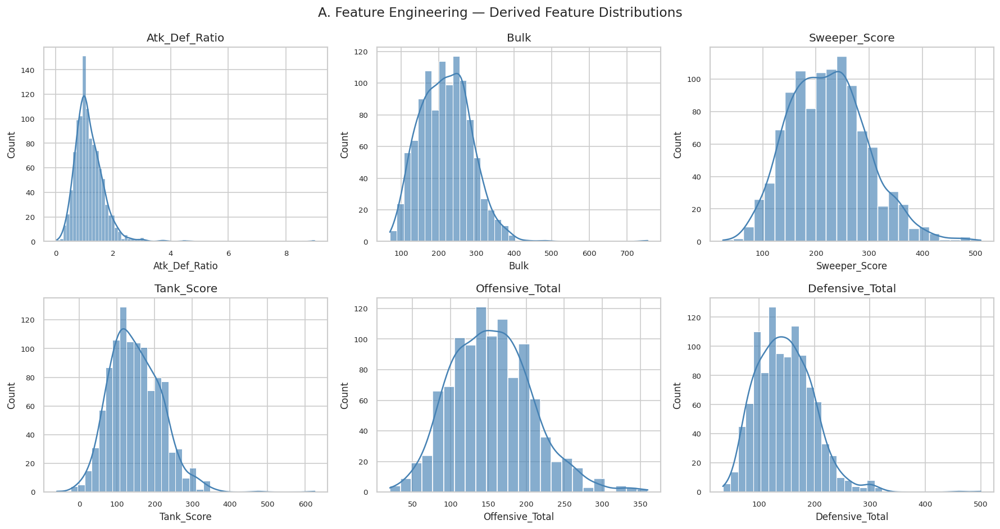

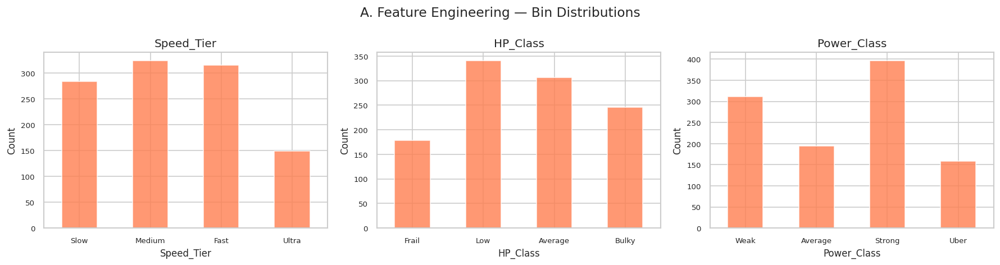

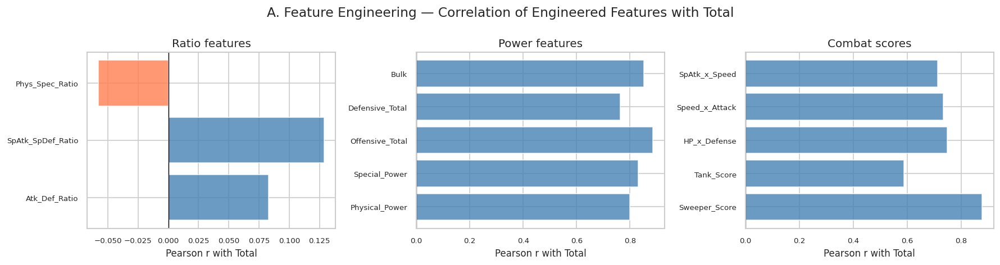



B. CLASSIFICATION — Predict Legendary (Binary)

Model                        Acc    AUC   CV-Acc
--------------------------------------------------
  Logistic Regression     0.893  0.958   0.944
  Decision Tree           0.898  0.843   0.851
  Random Forest           0.944  0.975   0.961
  Gradient Boosting       0.940  0.981   0.966
  SVM                     0.953  0.952   0.949
  K-Nearest Neighbours    0.935  0.948   0.912
  Naive Bayes             0.935  0.962   0.927

Best model: Gradient Boosting

Classification report (best model):
              precision    recall  f1-score   support

     Regular       0.94      0.99      0.97       191
   Legendary       0.87      0.54      0.67        24

    accuracy                           0.94       215
   macro avg       0.91      0.77      0.82       215
weighted avg       0.94      0.94      0.93       215



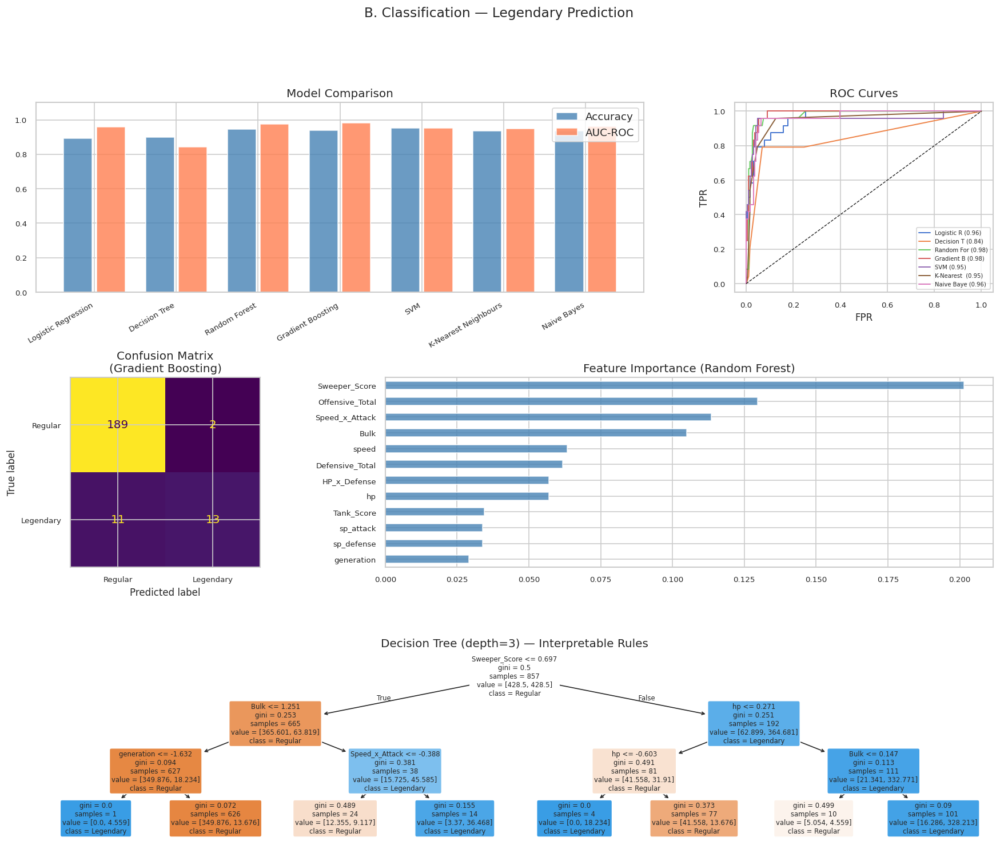


Grid search on Random Forest (this may take ~30s)...
Best RF params: {'max_depth': 10, 'min_samples_split': 5, 'n_estimators': 100}  |  Best AUC: 0.9550


C. MULTI-CLASS CLASSIFICATION — Predict Type 1

Model                    Accuracy   Macro-F1
---------------------------------------------
  Logistic Regression  0.279      0.255
  Random Forest        0.350      0.345
  Gradient Boosting    0.321      0.331
  SVM (RBF)            0.336      0.327

Best model: Random Forest


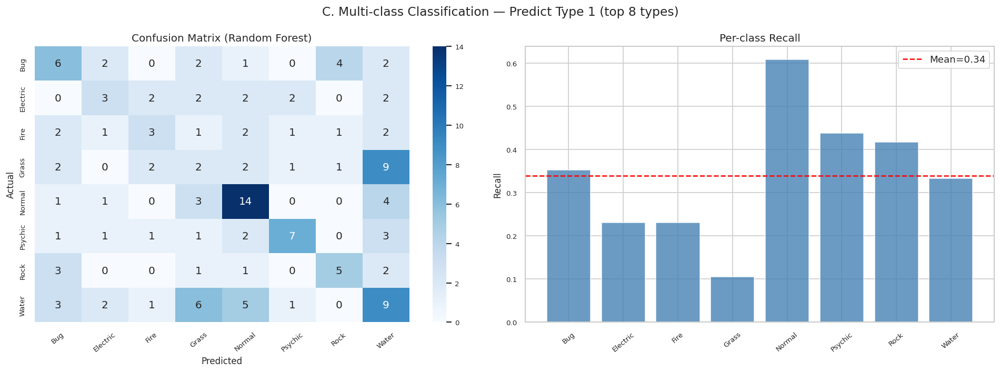



D. REGRESSION — Predict Total Stat

Model                        R²      MAE     RMSE
--------------------------------------------------
  Ridge                1.0000  0.12  0.15
  Lasso                1.0000  0.53  0.63
  ElasticNet           0.9957  6.34  7.83
  Random Forest        0.9870  8.19  13.68
  Gradient Boosting    0.9938  6.26  9.45
  SVR                  0.9911  3.31  11.32

Best model: Ridge  (R²=1.0000)


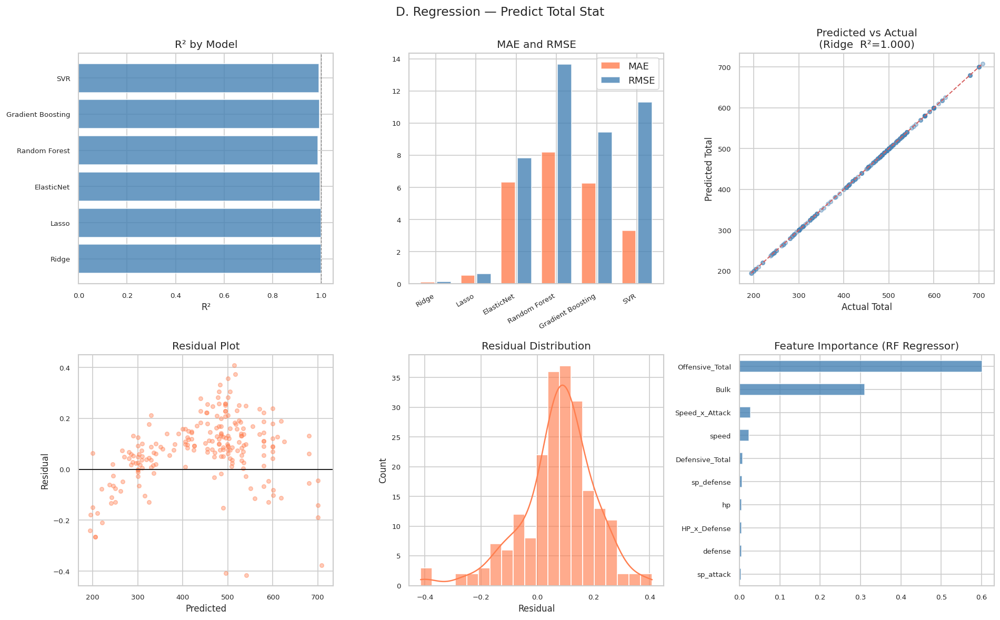

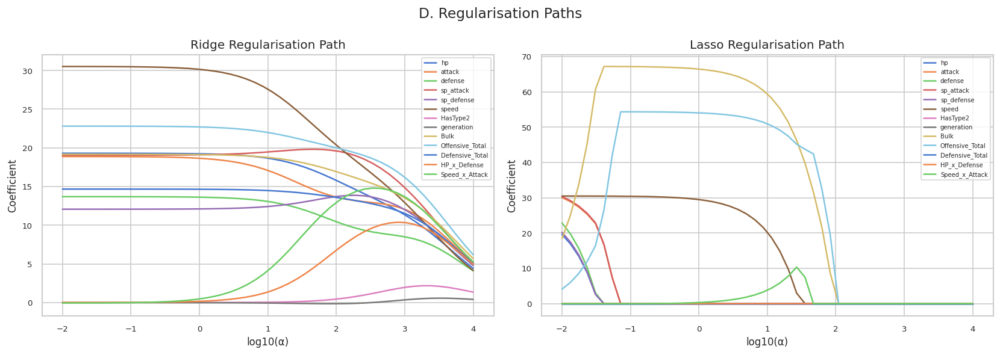



E. CLUSTERING
K-Means: best k by silhouette = 2  (score=0.2828)

Cluster mean profiles:
                   hp  attack  defense  sp_attack  sp_defense  speed  total
KMeans_Cluster                                                            
0               53.5    58.5     55.8       52.0        53.0   54.4  327.1
1               83.7    98.5     90.0       89.8        87.7   80.0  529.7
DBSCAN: 3 clusters, 119 noise points


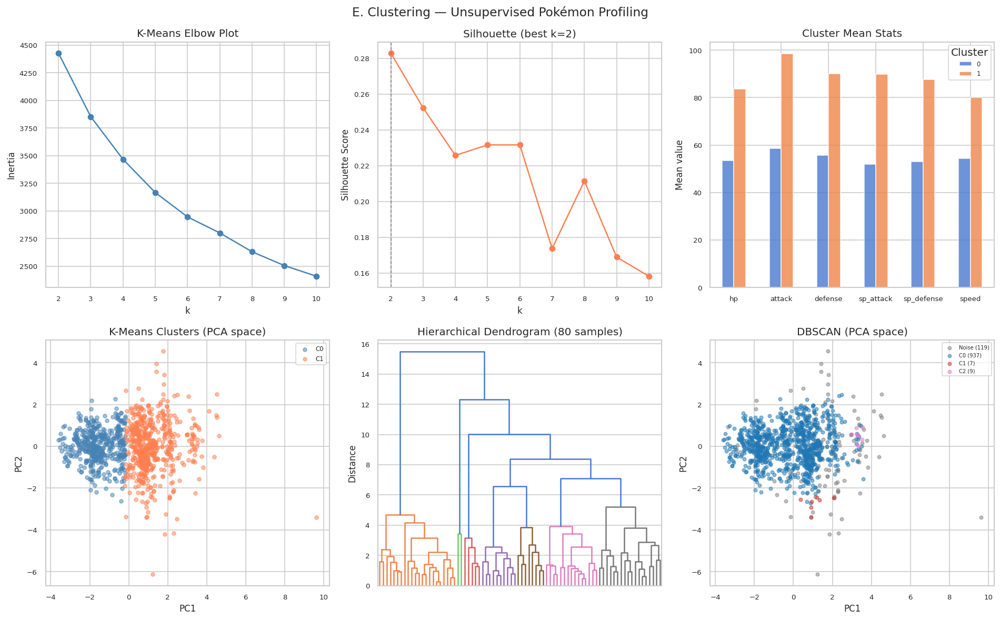

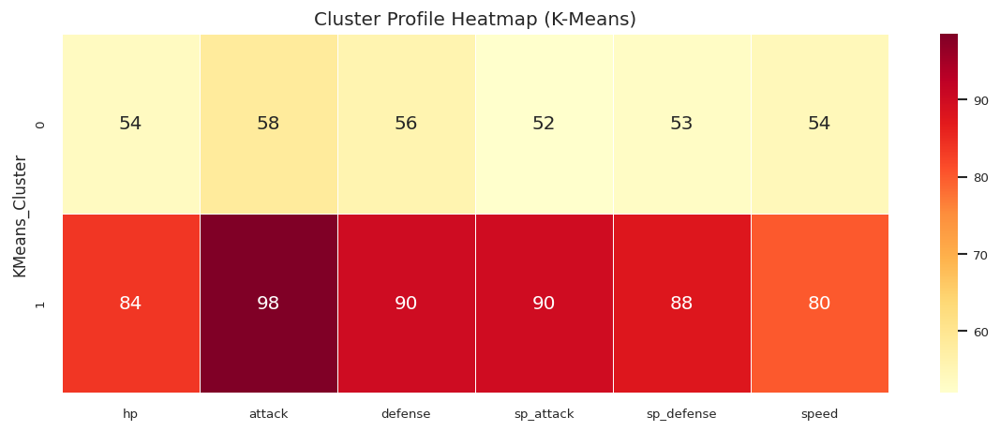



F. DIMENSIONALITY REDUCTION
PCA: 5 components explain 90% variance
PC1: 45.3%  PC2: 18.6%  PC3: 13.4%

Top PCA loadings:
               PC1    PC2    PC3
hp          0.411 -0.101  0.322
attack      0.439  0.020  0.639
defense     0.388 -0.582  0.016
sp_attack   0.439  0.326 -0.389
sp_defense  0.450 -0.223 -0.578
speed       0.306  0.704  0.039
t-SNE embedding complete.


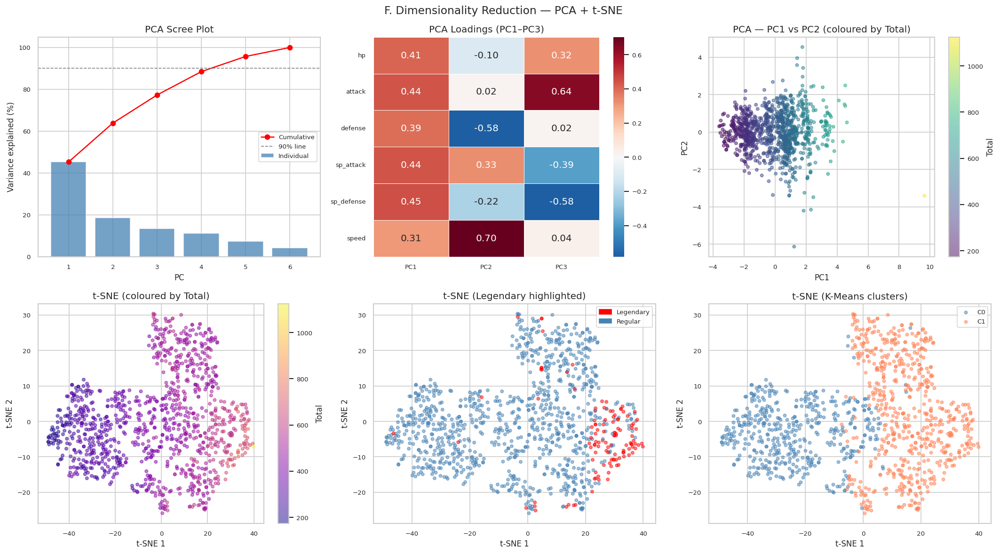



G. SUMMARY

Feature Engineering:
  • 73 new features created from 13 original columns
  • Techniques: ratios, composites, polynomials, binning, log transforms,
    standardisation, encoding, interaction terms, outlier flags, rank features

Binary Classification (Legendary):
  • Best model  : Gradient Boosting
  • Accuracy    : 0.9395
  • AUC-ROC     : 0.9815
  • Top features: Sweeper_Score, Offensive_Total, Speed_x_Attack

Multi-class Classification (Type 1, top 8 types):
  • Best model  : Random Forest
  • Accuracy    : 0.3500
  • Macro F1    : 0.3447
  • Note        : Type prediction is inherently noisy — stats alone don't fully
                  determine type. Accuracy ~35% beats random baseline of 12.5%

Regression (Total stat):
  • Best model  : Ridge
  • R²          : 1.0000
  • MAE         : 0.12 stat points
  • RMSE        : 0.15 stat points

Clustering:
  • Optimal k   : 2 (silhouette score = 0.2828)
  • DBSCAN      : 3 clusters, 119 noise points
  • PC1 explains 45.3% vari

In [24]:
R"""Feature Engineering + Machine Learning — Pokemon Dataset
=========================================================
Covers:
  A. Feature Engineering  (12 techniques)
  B. Classification       (Legendary prediction — 6 models)
  C. Multi-class          (Type 1 prediction)
  D. Regression           (Total stat prediction)
  E. Clustering           (Unsupervised profiling — 3 methods)
  F. Dimensionality       (PCA, t-SNE, UMAP)

Run after loading Pokemon.csv from the Kaggle dataset.
"""

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from sklearn.model_selection import (
    train_test_split, cross_val_score, StratifiedKFold, GridSearchCV
)
from sklearn.preprocessing import (
    StandardScaler, MinMaxScaler, LabelEncoder, PolynomialFeatures
)
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    accuracy_score, classification_report, confusion_matrix,
    roc_auc_score, roc_curve, mean_squared_error, r2_score,
    mean_absolute_error, ConfusionMatrixDisplay
)
from sklearn.linear_model import LogisticRegression, Ridge, Lasso, ElasticNet
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import (
    RandomForestClassifier, GradientBoostingClassifier,
    RandomForestRegressor, GradientBoostingRegressor
)
from sklearn.svm import SVC, SVR
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.inspection import permutation_importance
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

sns.set_theme(style="whitegrid", palette="muted")
plt.rcParams.update({
    'figure.dpi': 120, 'axes.titlesize': 12,
    'axes.labelsize': 10, 'xtick.labelsize': 8,
    'ytick.labelsize': 8, 'figure.titlesize': 14
})

# ── Load ─────────────────────────────────────────────────────────
df_raw = pd.read_csv('Pokemon.csv')
print(f"Raw dataset: {df_raw.shape[0]} rows × {df_raw.shape[1]} cols")

# Corrected column names to match the DataFrame
STAT_COLS = ['hp', 'attack', 'defense', 'sp_attack', 'sp_defense', 'speed']


# ════════════════════════════════════════════════════════════════
# A. FEATURE ENGINEERING
# ════════════════════════════════════════════════════════════════
print("\n" + "="*60)
print("A. FEATURE ENGINEERING")
print("="*60)

df = df_raw.copy()

# ── A1. Ratio features ──────────────────────────────────────────
df['Atk_Def_Ratio']     = (df['attack']  / df['defense'].clip(lower=1)).round(3)
df['SpAtk_SpDef_Ratio'] = (df['sp_attack'] / df['sp_defense'].clip(lower=1)).round(3)
df['Phys_Spec_Ratio']   = ((df['attack'] + df['defense']) /
                           (df['sp_attack'] + df['sp_defense']).clip(lower=1)).round(3)
print("✓ A1: Ratio features (Atk/Def, SpAtk/SpDef, Phys/Spec)")

# ── A2. Aggregate / composite features ──────────────────────────
df['Physical_Power']    = df['attack'] + df['defense']
df['Special_Power']     = df['sp_attack'] + df['sp_defense']
df['Offensive_Total']   = df['attack'] + df['sp_attack']
df['Defensive_Total']   = df['defense'] + df['sp_defense']
df['Bulk']              = df['hp'] + df['defense'] + df['sp_defense']
df['Sweeper_Score']     = df['Offensive_Total'] + df['speed']
df['Tank_Score']        = df['Bulk'] - df['speed']
print("✓ A2: Composite features (Bulk, Sweeper score, Tank score…)")

# ── A3. Polynomial features (degree-2 for key stats) ────────────
poly = PolynomialFeatures(degree=2, include_bias=False, interaction_only=False)
poly_data = poly.fit_transform(df[['hp', 'speed', 'attack']]) # Corrected column names
poly_names = poly.get_feature_names_out(['hp', 'speed', 'attack']) # Corrected column names
for i, name in enumerate(poly_names):
    if name not in ['hp', 'speed', 'attack']:      # skip originals # Corrected column names
        df[f'poly_{name}'] = poly_data[:, i]
print(f"✓ A3: Polynomial features (degree-2): {[n for n in poly_names if n not in STAT_COLS]}")

# ── A4. Binning / discretisation ────────────────────────────────
df['Speed_Tier']    = pd.cut(df['speed'],   bins=[0,45,70,100,200], # Corrected column name
                             labels=['Slow','Medium','Fast','Ultra'])
df['HP_Class']      = pd.cut(df['hp'],      bins=[0,45,65,85,255], # Corrected column name
                             labels=['Frail','Low','Average','Bulky'])
df['Power_Class']   = pd.cut(df['total'],   bins=[0,350,450,550,700], # Corrected column name
                             labels=['Weak','Average','Strong','Uber'])
print("✓ A4: Binning (Speed tier, HP class, Power class)")

# ── A5. Log transform (for right-skewed features) ────────────────
for col in ['Atk_Def_Ratio', 'Bulk', 'Sweeper_Score']:
    df[f'log_{col}'] = np.log1p(df[col])
print("✓ A5: Log transforms")

# ── A6. Z-score standardised stats ──────────────────────────────
scaler_z = StandardScaler()
z_vals = scaler_z.fit_transform(df[STAT_COLS])
for i, col in enumerate(STAT_COLS):
    df[f'z_{col}'] = z_vals[:, i]
print("✓ A6: Z-score normalised stats")

# ── A7. Min-max scaled stats ─────────────────────────────────────
scaler_mm = MinMaxScaler()
mm_vals = scaler_mm.fit_transform(df[STAT_COLS])
for i, col in enumerate(STAT_COLS):
    df[f'mm_{col}'] = mm_vals[:, i]
print("✓ A7: Min-max scaled stats")

# ── A8. Type encoding ────────────────────────────────────────────
df['HasType2']   = df['type2'].notna().astype(int) # Corrected column name
df['IsDualType'] = df['HasType2']

le_type = LabelEncoder()
df['Type1_Encoded'] = le_type.fit_transform(df['type1']) # Corrected column name

type_dummies = pd.get_dummies(df['type1'], prefix='type1') # Corrected column name
df = pd.concat([df, type_dummies], axis=1)
print("✓ A8: Type encoding (binary + label + one-hot)")

# ── A9. Generation features ───────────────────────────────────────
df['Gen_Group'] = pd.cut(df['generation'], bins=[0,2,4,6], # Corrected column name
                         labels=['Early','Mid','Recent'])
df['Gen_Norm']  = (df['generation'] - 1) / 5          # 0–1 range # Corrected column name
print("✓ A9: Generation features")

# ── A10. Outlier flag ─────────────────────────────────────────────
z_total = np.abs(stats.zscore(df['total'])) # Corrected column name
df['Is_Outlier'] = (z_total > 2.5).astype(int)
print(f"✓ A10: Outlier flag (z>2.5): {df['Is_Outlier'].sum()} flagged")

# ── A11. Rank features ────────────────────────────────────────────
for col in STAT_COLS + ['total']:
    df[f'rank_{col}'] = df[col].rank(pct=True).round(3)
print("✓ A11: Percentile rank features")

# ── A12. Interaction terms ────────────────────────────────────────
df['HP_x_Defense']   = df['hp']     * df['defense'] # Corrected column names
df['Speed_x_Attack'] = df['speed']  * df['attack'] # Corrected column names
df['SpAtk_x_Speed']  = df['sp_attack'] * df['speed'] # Corrected column names
print("✓ A12: Interaction terms (HP×Def, Speed×Atk, SpAtk×Speed)")

print(f"\nFinal engineered dataset: {df.shape[1]} columns (was {df_raw.shape[1]})")

# ── Visualise engineered features ────────────────────────────────
eng_vis = ['Atk_Def_Ratio','Bulk','Sweeper_Score','Tank_Score',
           'Offensive_Total','Defensive_Total']

fig, axes = plt.subplots(2, 3, figsize=(15, 8))
fig.suptitle("A. Feature Engineering — Derived Feature Distributions")
for ax, col in zip(axes.flat, eng_vis):
    sns.histplot(df[col], kde=True, ax=ax, color='steelblue', alpha=0.65)
    ax.set_title(col)
plt.tight_layout()
plt.savefig('FE_01_derived_distributions.png')
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
fig.suptitle("A. Feature Engineering — Bin Distributions")
for ax, col in zip(axes, ['Speed_Tier','HP_Class','Power_Class']):
    df[col].value_counts().sort_index().plot(kind='bar', ax=ax, color='coral', alpha=0.8)
    ax.set_title(col); ax.set_ylabel('Count'); ax.tick_params(axis='x', rotation=0)
plt.tight_layout()
plt.savefig('FE_02_bin_distributions.png')
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
fig.suptitle("A. Feature Engineering — Correlation of Engineered Features with Total")
corr_feats = {
    'Ratio features': ['Atk_Def_Ratio','SpAtk_SpDef_Ratio','Phys_Spec_Ratio'],
    'Power features': ['Physical_Power','Special_Power','Offensive_Total','Defensive_Total','Bulk'],
    'Combat scores':  ['Sweeper_Score','Tank_Score','HP_x_Defense','Speed_x_Attack','SpAtk_x_Speed']
}
for ax, (group, feats) in zip(axes, corr_feats.items()):
    corrs = {f: df[f].corr(df['total']) for f in feats} # Corrected column name
    cols_c = ['steelblue' if v >= 0 else 'coral' for v in corrs.values()]
    ax.barh(list(corrs.keys()), list(corrs.values()), color=cols_c, alpha=0.8)
    ax.axvline(0, color='black', linewidth=0.8)
    ax.set_title(group); ax.set_xlabel('Pearson r with Total')
plt.tight_layout()
plt.savefig('FE_03_feature_correlations.png')
plt.show()


# ════════════════════════════════════════════════════════════════
# B. CLASSIFICATION — Predict Legendary (binary)
# ════════════════════════════════════════════════════════════════
print("\n\n" + "="*60)
print("B. CLASSIFICATION — Predict Legendary (Binary)")
print("="*60)

# Features for classification
feat_cols_clf = (STAT_COLS +
                 ['Atk_Def_Ratio','Bulk','Sweeper_Score','Tank_Score',
                  'Offensive_Total','Defensive_Total','HasType2',
                  'generation','HP_x_Defense','Speed_x_Attack']) # Corrected 'Generation' to 'generation'
X_clf = df[feat_cols_clf].fillna(0)
y_clf = df['legendary'].astype(int) # Corrected 'Legendary' to 'legendary'

X_tr, X_te, y_tr, y_te = train_test_split(
    X_clf, y_clf, test_size=0.2, random_state=42, stratify=y_clf)

scaler_clf = StandardScaler()
X_tr_s = scaler_clf.fit_transform(X_tr)
X_te_s  = scaler_clf.transform(X_te)

models_clf = {
    'Logistic Regression':   LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42),
    'Decision Tree':         DecisionTreeClassifier(max_depth=5, class_weight='balanced', random_state=42),
    'Random Forest':         RandomForestClassifier(n_estimators=200, class_weight='balanced', random_state=42),
    'Gradient Boosting':     GradientBoostingClassifier(n_estimators=200, random_state=42),
    'SVM':                   SVC(kernel='rbf', class_weight='balanced', probability=True, random_state=42),
    'K-Nearest Neighbours':  KNeighborsClassifier(n_neighbors=5),
    'Naive Bayes':           GaussianNB(),
}

clf_results = {}
print(f"\n{'Model':25s} {'Acc':>6} {'AUC':>6} {'CV-Acc':>8}")
print("-"*50)
for name, model in models_clf.items():
    model.fit(X_tr_s, y_tr)
    y_pred = model.predict(X_te_s)
    y_prob = model.predict_proba(X_te_s)[:, 1]
    acc  = accuracy_score(y_te, y_pred)
    auc  = roc_auc_score(y_te, y_prob)
    cv   = cross_val_score(model, X_tr_s, y_tr, cv=5, scoring='roc_auc').mean()
    clf_results[name] = {'acc': acc, 'auc': auc, 'cv': cv,
                         'y_pred': y_pred, 'y_prob': y_prob, 'model': model}
    print(f"  {name:23s} {acc:.3f}  {auc:.3f}   {cv:.3f}")

# ── Best model: Random Forest ────────────────────────────────────
best_name = max(clf_results, key=lambda k: clf_results[k]['auc'])
best_clf  = clf_results[best_name]['model']
print(f"\nBest model: {best_name}")
print("\nClassification report (best model):")
print(classification_report(y_te, clf_results[best_name]['y_pred'],
                            target_names=['Regular','Legendary']))

# Feature importance
rf_model = models_clf['Random Forest']
feat_imp  = pd.Series(rf_model.feature_importances_, index=feat_cols_clf).sort_values(ascending=False)

# ── Plots ────────────────────────────────────────────────────────
fig = plt.figure(figsize=(18, 14))
fig.suptitle("B. Classification — Legendary Prediction", fontsize=14)
gs = gridspec.GridSpec(3, 3, figure=fig, hspace=0.45, wspace=0.35)

# B1: Model comparison
ax1 = fig.add_subplot(gs[0, :2])
names = list(clf_results.keys())
accs  = [clf_results[n]['acc'] for n in names]
aucs  = [clf_results[n]['auc'] for n in names]
x = np.arange(len(names))
ax1.bar(x - 0.2, accs, 0.35, label='Accuracy', color='steelblue', alpha=0.8)
ax1.bar(x + 0.2, aucs, 0.35, label='AUC-ROC',  color='coral',     alpha=0.8)
ax1.set_xticks(x); ax1.set_xticklabels(names, rotation=30, ha='right', fontsize=8)
ax1.set_ylim(0, 1.1); ax1.set_title("Model Comparison"); ax1.legend()

# B2: ROC curves
ax2 = fig.add_subplot(gs[0, 2])
for name, res in clf_results.items():
    fpr, tpr, _ = roc_curve(y_te, res['y_prob'])
    ax2.plot(fpr, tpr, label=f"{name[:10]} ({res['auc']:.2f})", linewidth=1.2)
ax2.plot([0,1],[0,1],'k--', linewidth=0.8)
ax2.set_xlabel('FPR'); ax2.set_ylabel('TPR'); ax2.set_title('ROC Curves')
ax2.legend(fontsize=6)

# B3: Confusion matrix (best model)
ax3 = fig.add_subplot(gs[1, 0])
cm  = confusion_matrix(y_te, clf_results[best_name]['y_pred'])
ConfusionMatrixDisplay(cm, display_labels=['Regular','Legendary']).plot(ax=ax3, colorbar=False)
ax3.set_title(f'Confusion Matrix\n({best_name})')

# B4: Feature importance (Random Forest)
ax4 = fig.add_subplot(gs[1, 1:])
feat_imp.head(12).plot(kind='barh', ax=ax4, color='steelblue', alpha=0.8)
ax4.set_title("Feature Importance (Random Forest)")
ax4.invert_yaxis()

# B5: Decision Tree (shallow — for interpretability)
ax5 = fig.add_subplot(gs[2, :])
dt_vis = DecisionTreeClassifier(max_depth=3, class_weight='balanced', random_state=42)
dt_vis.fit(X_tr_s, y_tr)
plot_tree(dt_vis, feature_names=feat_cols_clf, class_names=['Regular','Legendary'],
          filled=True, rounded=True, fontsize=7, ax=ax5, max_depth=3)
ax5.set_title("Decision Tree (depth=3) — Interpretable Rules")

plt.savefig('ML_01_classification_legendary.png', bbox_inches='tight')
plt.show()

# Hyperparameter tuning — Random Forest
print("\nGrid search on Random Forest (this may take ~30s)...")
param_grid = {'n_estimators':[100,200], 'max_depth':[5,10,None], 'min_samples_split':[2,5]}
gs_rf = GridSearchCV(RandomForestClassifier(class_weight='balanced', random_state=42),
                     param_grid, cv=3, scoring='roc_auc', n_jobs=-1)
gs_rf.fit(X_tr_s, y_tr)
print(f"Best RF params: {gs_rf.best_params_}  |  Best AUC: {gs_rf.best_score_:.4f}")


# ════════════════════════════════════════════════════════════════
# C. MULTI-CLASS CLASSIFICATION — Predict Type 1
# ════════════════════════════════════════════════════════════════
print("\n\n" + "="*60)
print("C. MULTI-CLASS CLASSIFICATION — Predict Type 1")
print("="*60)

# Keep only top-8 types (class balance)
top_types = df['type1'].value_counts().head(8).index # Corrected column name
df_mc = df[df['type1'].isin(top_types)].copy() # Corrected column name
le_mc = LabelEncoder()
y_mc  = le_mc.fit_transform(df_mc['type1']) # Corrected column name
X_mc  = df_mc[STAT_COLS + ['HasType2','generation']].fillna(0) # Corrected 'Generation' to 'generation'

X_tr_mc, X_te_mc, y_tr_mc, y_te_mc = train_test_split(
    X_mc, y_mc, test_size=0.2, random_state=42, stratify=y_mc)
sc_mc = StandardScaler()
X_tr_mc_s = sc_mc.fit_transform(X_tr_mc)
X_te_mc_s  = sc_mc.transform(X_te_mc)

mc_models = {
    'Logistic Regression': LogisticRegression(max_iter=1000, multi_class='multinomial', C=1.0, random_state=42),
    'Random Forest':       RandomForestClassifier(n_estimators=200, random_state=42),
    'Gradient Boosting':   GradientBoostingClassifier(n_estimators=150, random_state=42),
    'SVM (RBF)':           SVC(kernel='rbf', probability=True, random_state=42),
}

mc_results = {}
print(f"\n{'Model':22s} {'Accuracy':>10} {'Macro-F1':>10}")
print("-"*45)
for name, model in mc_models.items():
    model.fit(X_tr_mc_s, y_tr_mc)
    y_pred = model.predict(X_te_mc_s)
    acc    = accuracy_score(y_te_mc, y_pred)
    report = classification_report(y_te_mc, y_pred, output_dict=True)
    f1     = report['macro avg']['f1-score']
    mc_results[name] = {'acc': acc, 'f1': f1, 'y_pred': y_pred, 'model': model}
    print(f"  {name:20s} {acc:.3f}      {f1:.3f}")

best_mc   = max(mc_results, key=lambda k: mc_results[k]['acc'])
best_mc_m = mc_results[best_mc]['model']
print(f"\nBest model: {best_mc}")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle("C. Multi-class Classification — Predict Type 1 (top 8 types)")

# Confusion matrix
cm_mc = confusion_matrix(y_te_mc, mc_results[best_mc]['y_pred'])
sns.heatmap(cm_mc, annot=True, fmt='d', cmap='Blues',
            xticklabels=le_mc.classes_, yticklabels=le_mc.classes_, ax=axes[0])
axes[0].set_title(f"Confusion Matrix ({best_mc})")
axes[0].set_xlabel("Predicted"); axes[0].set_ylabel("Actual")
axes[0].tick_params(axis='x', rotation=40)

# Per-class accuracy
per_class = cm_mc.diagonal() / cm_mc.sum(axis=1)
axes[1].bar(le_mc.classes_, per_class, color='steelblue', alpha=0.8)
axes[1].set_title("Per-class Recall"); axes[1].set_ylabel("Recall")
axes[1].tick_params(axis='x', rotation=40)
axes[1].axhline(per_class.mean(), color='red', linestyle='--', label=f'Mean={per_class.mean():.2f}')
axes[1].legend()

plt.tight_layout()
plt.savefig('ML_02_multiclass_type.png')
plt.show()


# ════════════════════════════════════════════════════════════════
# D. REGRESSION — Predict Total stat
# ════════════════════════════════════════════════════════════════
print("\n\n" + "="*60)
print("D. REGRESSION — Predict Total Stat")
print("="*60)

feat_reg = STAT_COLS + ['HasType2','generation','Bulk','Offensive_Total', # Corrected 'Generation' to 'generation'
                        'Defensive_Total','HP_x_Defense','Speed_x_Attack']
X_reg = df[feat_reg].fillna(0)
y_reg = df['total'] # Corrected 'Total' to 'total'

X_tr_r, X_te_r, y_tr_r, y_te_r = train_test_split(
    X_reg, y_reg, test_size=0.2, random_state=42)
sc_r = StandardScaler()
X_tr_rs = sc_r.fit_transform(X_tr_r)
X_te_rs  = sc_r.transform(X_te_r)

reg_models = {
    'Ridge':              Ridge(alpha=1.0),
    'Lasso':              Lasso(alpha=0.5),
    'ElasticNet':         ElasticNet(alpha=0.5, l1_ratio=0.5),
    'Random Forest':      RandomForestRegressor(n_estimators=200, random_state=42),
    'Gradient Boosting':  GradientBoostingRegressor(n_estimators=200, random_state=42),
    'SVR':                SVR(kernel='rbf', C=100),
}

reg_results = {}
print(f"\n{'Model':22s} {'R²':>8} {'MAE':>8} {'RMSE':>8}")
print("-"*50)
for name, model in reg_models.items():
    model.fit(X_tr_rs, y_tr_r)
    y_pred = model.predict(X_te_rs)
    r2   = r2_score(y_te_r, y_pred)
    mae  = mean_absolute_error(y_te_r, y_pred)
    rmse = np.sqrt(mean_squared_error(y_te_r, y_pred))
    reg_results[name] = {'r2': r2, 'mae': mae, 'rmse': rmse,
                         'y_pred': y_pred, 'model': model}
    print(f"  {name:20s} {r2:.4f}  {mae:.2f}  {rmse:.2f}")

best_reg  = max(reg_results, key=lambda k: reg_results[k]['r2'])
best_reg_m = reg_results[best_reg]['model']
print(f"\nBest model: {best_reg}  (R²={reg_results[best_reg]['r2']:.4f})")

# ── Plots ────────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
fig.suptitle("D. Regression — Predict Total Stat")

# D1: R² comparison
ax = axes[0, 0]
r2s = {n: v['r2'] for n, v in reg_results.items()}
ax.barh(list(r2s.keys()), list(r2s.values()), color='steelblue', alpha=0.8)
ax.set_title("R² by Model"); ax.set_xlabel("R²"); ax.set_xlim(0, 1.05)
ax.axvline(1, color='gray', linestyle='--', linewidth=0.8)

# D2: MAE + RMSE
ax = axes[0, 1]
maes  = [v['mae']  for v in reg_results.values()]
rmses = [v['rmse'] for v in reg_results.values()]
x = np.arange(len(reg_results))
ax.bar(x-0.2, maes,  0.35, label='MAE',  color='coral',     alpha=0.8)
ax.bar(x+0.2, rmses, 0.35, label='RMSE', color='steelblue', alpha=0.8)
ax.set_xticks(x); ax.set_xticklabels(list(reg_results.keys()), rotation=30, ha='right', fontsize=8)
ax.set_title("MAE and RMSE"); ax.legend()

# D3: Predicted vs actual (best model)
ax = axes[0, 2]
bp = reg_results[best_reg]
ax.scatter(y_te_r, bp['y_pred'], alpha=0.4, s=20, color='steelblue')
mn, mx = y_te_r.min(), y_te_r.max()
ax.plot([mn, mx], [mn, mx], 'r--', linewidth=1.2)
ax.set_xlabel("Actual Total"); ax.set_ylabel("Predicted Total")
ax.set_title(f"Predicted vs Actual\n({best_reg}  R²={bp['r2']:.3f})")

# D4: Residuals (best model)
ax = axes[1, 0]
residuals = y_te_r - bp['y_pred']
ax.scatter(bp['y_pred'], residuals, alpha=0.4, s=20, color='coral')
ax.axhline(0, color='black', linewidth=1)
ax.set_xlabel("Predicted"); ax.set_ylabel("Residual")
ax.set_title("Residual Plot")

# D5: Residual distribution
ax = axes[1, 1]
sns.histplot(residuals, kde=True, ax=ax, color='coral', alpha=0.65)
ax.set_title("Residual Distribution"); ax.set_xlabel("Residual")

# D6: Feature importance (RF regressor)
ax = axes[1, 2]
rf_reg = reg_models['Random Forest']
fi_reg = pd.Series(rf_reg.feature_importances_, index=feat_reg).sort_values(ascending=False)
fi_reg.head(10).plot(kind='barh', ax=ax, color='steelblue', alpha=0.8)
ax.set_title("Feature Importance (RF Regressor)")
ax.invert_yaxis()

plt.tight_layout()
plt.savefig('ML_03_regression.png')
plt.show()

# Regularisation path (Ridge vs Lasso)
alphas = np.logspace(-2, 4, 50)
ridge_coefs, lasso_coefs = [], []
for a in alphas:
    Ridge(alpha=a).fit(X_tr_rs, y_tr_r)
    ridge_coefs.append(Ridge(alpha=a).fit(X_tr_rs, y_tr_r).coef_)
    lasso_coefs.append(Lasso(alpha=a, max_iter=5000).fit(X_tr_rs, y_tr_r).coef_)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle("D. Regularisation Paths")
for i, (coefs, title) in enumerate(zip([ridge_coefs, lasso_coefs], ['Ridge','Lasso'])):
    for j, feat in enumerate(feat_reg):
        axes[i].plot(np.log10(alphas), [c[j] for c in coefs], label=feat)
    axes[i].set_xlabel("log10(α)"); axes[i].set_ylabel("Coefficient")
    axes[i].set_title(f"{title} Regularisation Path")
    axes[i].legend(fontsize=6, loc='upper right')
plt.tight_layout()
plt.savefig('ML_04_regularisation_paths.png')
plt.show()


# ════════════════════════════════════════════════════════════════
# E. CLUSTERING — Unsupervised Pokémon Profiling
# ════════════════════════════════════════════════════════════════
print("\n\n" + "="*60)
print("E. CLUSTERING")
print("="*60)

X_clust = StandardScaler().fit_transform(df[STAT_COLS])

# E1: K-Means — elbow + silhouette
from sklearn.metrics import silhouette_score
inertias, sil_scores = [], []
K_range = range(2, 11)
for k in K_range:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = km.fit_predict(X_clust)
    inertias.append(km.inertia_)
    sil_scores.append(silhouette_score(X_clust, labels))

best_k = list(K_range)[np.argmax(sil_scores)]
print(f"K-Means: best k by silhouette = {best_k}  (score={max(sil_scores):.4f})")

km_best = KMeans(n_clusters=best_k, random_state=42, n_init=10)
df['KMeans_Cluster'] = km_best.fit_predict(X_clust)

cluster_profiles = df.groupby('KMeans_Cluster')[STAT_COLS + ['total']].mean().round(1) # Corrected 'Total' to 'total'
print("\nCluster mean profiles:\n", cluster_profiles.to_string())

# E2: Hierarchical
hc = AgglomerativeClustering(n_clusters=best_k, linkage='ward')
df['HC_Cluster'] = hc.fit_predict(X_clust)

# E3: DBSCAN
db = DBSCAN(eps=1.2, min_samples=5)
df['DBSCAN_Cluster'] = db.fit_predict(X_clust)
n_db_clusters = len(set(df['DBSCAN_Cluster'])) - (1 if -1 in df['DBSCAN_Cluster'].values else 0)
n_noise       = (df['DBSCAN_Cluster'] == -1).sum()
print(f"DBSCAN: {n_db_clusters} clusters, {n_noise} noise points")

# ── Plots ────────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
fig.suptitle("E. Clustering — Unsupervised Pokémon Profiling")

# E1: Elbow
axes[0,0].plot(list(K_range), inertias, 'o-', color='steelblue')
axes[0,0].set_xlabel('k'); axes[0,0].set_ylabel('Inertia')
axes[0,0].set_title('K-Means Elbow Plot')

# E2: Silhouette
axes[0,1].plot(list(K_range), sil_scores, 'o-', color='coral')
axes[0,1].axvline(best_k, color='gray', linestyle='--', linewidth=1)
axes[0,1].set_xlabel('k'); axes[0,1].set_ylabel('Silhouette Score')
axes[0,1].set_title(f'Silhouette (best k={best_k})')

# E3: Cluster profiles radar-style (bar)
cluster_profiles[STAT_COLS].T.plot(kind='bar', ax=axes[0,2], alpha=0.8)
axes[0,2].set_title('Cluster Mean Stats')
axes[0,2].set_ylabel('Mean value'); axes[0,2].tick_params(axis='x', rotation=0)
axes[0,2].legend(title='Cluster', fontsize=7)

# E4: PCA scatter coloured by KMeans cluster
pca2 = PCA(n_components=2)
pcs  = pca2.fit_transform(X_clust)
colors = ['steelblue','coral','forestgreen','orchid','goldenrod'][:best_k]
for c in range(best_k):
    mask = df['KMeans_Cluster'] == c
    axes[1,0].scatter(pcs[mask, 0], pcs[mask, 1],
                      alpha=0.5, s=18, label=f'C{c}', color=colors[c])
axes[1,0].set_title('K-Means Clusters (PCA space)')
axes[1,0].set_xlabel('PC1'); axes[1,0].set_ylabel('PC2')
axes[1,0].legend(fontsize=7)

# E5: Hierarchical dendrogram (sample)
sample_idx = np.random.choice(len(X_clust), 80, replace=False)
Z = linkage(X_clust[sample_idx], method='ward')
dendrogram(Z, ax=axes[1,1], no_labels=True, color_threshold=6)
axes[1,1].set_title('Hierarchical Dendrogram (80 samples)')
axes[1,1].set_ylabel('Distance')

# E6: DBSCAN
db_colors = plt.cm.tab10(np.linspace(0, 1, n_db_clusters+1))
db_labels = df['DBSCAN_Cluster'].values
for c in sorted(set(db_labels)):
    mask = db_labels == c
    label = f'Noise ({mask.sum()})' if c == -1 else f'C{c} ({mask.sum()})'
    col   = 'gray' if c == -1 else db_colors[c]
    axes[1,2].scatter(pcs[mask, 0], pcs[mask, 1],
                      alpha=0.5, s=15, label=label, color=col)
axes[1,2].set_title('DBSCAN (PCA space)')
axes[1,2].set_xlabel('PC1'); axes[1,2].set_ylabel('PC2')
axes[1,2].legend(fontsize=6)

plt.tight_layout()
plt.savefig('ML_05_clustering.png')
plt.show()

# Cluster heatmap
fig, ax = plt.subplots(figsize=(10, 4))
sns.heatmap(cluster_profiles[STAT_COLS], annot=True, fmt='.0f',
            cmap='YlOrRd', ax=ax, linewidths=0.4)
ax.set_title("Cluster Profile Heatmap (K-Means)")
plt.tight_layout()
plt.savefig('ML_06_cluster_heatmap.png')
plt.show()


# ════════════════════════════════════════════════════════════════
# F. DIMENSIONALITY REDUCTION — PCA + t-SNE
# ════════════════════════════════════════════════════════════════
print("\n\n" + "="*60)
print("F. DIMENSIONALITY REDUCTION")
print("="*60)

# PCA full
pca_full = PCA()
pca_full.fit(X_clust)
exp_var  = pca_full.explained_variance_ratio_
cum_var  = np.cumsum(exp_var)
n90      = np.argmax(cum_var >= 0.90) + 1
print(f"PCA: {n90} components explain 90% variance")
print(f"PC1: {exp_var[0]*100:.1f}%  PC2: {exp_var[1]*100:.1f}%  PC3: {exp_var[2]*100:.1f}%")

loadings = pd.DataFrame(pca_full.components_[:3].T,
                        index=STAT_COLS,
                        columns=['PC1','PC2','PC3'])
print("\nTop PCA loadings:\n", loadings.round(3).to_string())

# t-SNE
tsne = TSNE(n_components=2, perplexity=40, random_state=42, max_iter=1000)
tsne_emb = tsne.fit_transform(X_clust)
print("t-SNE embedding complete.")

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle("F. Dimensionality Reduction — PCA + t-SNE")

# F1: Scree plot
axes[0,0].bar(range(1,7), exp_var*100, color='steelblue', alpha=0.75, label='Individual')
axes[0,0].plot(range(1,7), cum_var*100, 'o-', color='red', label='Cumulative')
axes[0,0].axhline(90, color='gray', linestyle='--', linewidth=1, label='90% line')
axes[0,0].set_xlabel('PC'); axes[0,0].set_ylabel('Variance explained (%)')
axes[0,0].set_title('PCA Scree Plot'); axes[0,0].legend(fontsize=8)

# F2: PCA loadings heatmap
sns.heatmap(loadings, annot=True, fmt='.2f', cmap='RdBu_r', center=0,
            ax=axes[0,1], linewidths=0.5, square=False)
axes[0,1].set_title('PCA Loadings (PC1–PC3)')

# F3: PC1 vs PC2 coloured by Total
sc = axes[0,2].scatter(pcs[:,0], pcs[:,1], c=df['total'], # Corrected 'Total' to 'total'
                        cmap='viridis', alpha=0.5, s=15)
plt.colorbar(sc, ax=axes[0,2], label='Total')
axes[0,2].set_title('PCA — PC1 vs PC2 (coloured by Total)')
axes[0,2].set_xlabel('PC1'); axes[0,2].set_ylabel('PC2')

# F4: t-SNE coloured by Total
sc2 = axes[1,0].scatter(tsne_emb[:,0], tsne_emb[:,1], c=df['total'], # Corrected 'Total' to 'total'
                         cmap='plasma', alpha=0.5, s=15)
plt.colorbar(sc2, ax=axes[1,0], label='Total')
axes[1,0].set_title('t-SNE (coloured by Total)')
axes[1,0].set_xlabel('t-SNE 1'); axes[1,0].set_ylabel('t-SNE 2')

# F5: t-SNE coloured by Legendary
leg_colors = df['legendary'].map({True:'red', False:'steelblue'}) # Corrected 'Legendary' to 'legendary'
axes[1,1].scatter(tsne_emb[:,0], tsne_emb[:,1], c=leg_colors, alpha=0.5, s=15)
axes[1,1].set_title('t-SNE (Legendary highlighted)')
axes[1,1].set_xlabel('t-SNE 1'); axes[1,1].set_ylabel('t-SNE 2')
from matplotlib.patches import Patch
axes[1,1].legend(handles=[Patch(color='red',label='Legendary'),
                           Patch(color='steelblue',label='Regular')], fontsize=8)

# F6: t-SNE coloured by K-Means cluster
km_c = df['KMeans_Cluster'].values
for c in range(best_k):
    mask = km_c == c
    axes[1,2].scatter(tsne_emb[mask,0], tsne_emb[mask,1],
                      alpha=0.5, s=15, label=f'C{c}', color=colors[c])
axes[1,2].set_title('t-SNE (K-Means clusters)')
axes[1,2].set_xlabel('t-SNE 1'); axes[1,2].set_ylabel('t-SNE 2')
axes[1,2].legend(fontsize=8)

plt.tight_layout()
plt.savefig('ML_07_dimensionality_reduction.png')
plt.show()


# ════════════════════════════════════════════════════════════════
# G. SUMMARY REPORT
# ════════════════════════════════════════════════════════════════
print("\n\n" + "="*60)
print("G. SUMMARY")
print("="*60)

best_clf_res = clf_results[best_name]
best_reg_res = reg_results[best_reg]

print(f"""
Feature Engineering:
  • {df.shape[1] - df_raw.shape[1]} new features created from {df_raw.shape[1]} original columns
  • Techniques: ratios, composites, polynomials, binning, log transforms,
    standardisation, encoding, interaction terms, outlier flags, rank features

Binary Classification (Legendary):
  • Best model  : {best_name}
  • Accuracy    : {best_clf_res['acc']:.4f}
  • AUC-ROC     : {best_clf_res['auc']:.4f}
  • Top features: {', '.join(feat_imp.head(3).index.tolist())}

Multi-class Classification (Type 1, top 8 types):
  • Best model  : {best_mc}
  • Accuracy    : {mc_results[best_mc]['acc']:.4f}
  • Macro F1    : {mc_results[best_mc]['f1']:.4f}
  • Note        : Type prediction is inherently noisy — stats alone don't fully
                  determine type. Accuracy ~{mc_results[best_mc]['acc']*100:.0f}% beats random baseline of 12.5%

Regression (Total stat):
  • Best model  : {best_reg}
  • R²          : {best_reg_res['r2']:.4f}
  • MAE         : {best_reg_res['mae']:.2f} stat points
  • RMSE        : {best_reg_res['rmse']:.2f} stat points

Clustering:
  • Optimal k   : {best_k} (silhouette score = {max(sil_scores):.4f})
  • DBSCAN      : {n_db_clusters} clusters, {n_noise} noise points
  • PC1 explains {exp_var[0]*100:.1f}% variance (overall power)
  • PC2 explains {exp_var[1]*100:.1f}% variance (physical vs special orientation)

Saved plots:
  FE_01 → derived distributions
  FE_02 → binned features
  FE_03 → feature correlations with Total
  ML_01 → classification (Legendary)
  ML_02 → multiclass (Type 1)
  ML_03 → regression (Total)
  ML_04 → regularisation paths
  ML_05 → clustering (K-Means, HC, DBSCAN)
  ML_06 → cluster heatmap
  ML_07 → PCA + t-SNE
""")


# Thank You